In [30]:
#Imports
from src.PCA import ComputeCovariance
from src.dim_red_viz import visualize_manifold_method
#REDO this to just import a function
from src.data.dimensionality_reduction.choose_dimension import choose_dimension
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
from rpy2.robjects.packages import importr
import rpy2.robjects as ro
from rpy2.robjects import r, pandas2ri
from sklearn.manifold import Isomap, SpectralEmbedding, LocallyLinearEmbedding
from copy import copy 
from sklearn.manifold import trustworthiness
from kneed import DataGenerator, KneeLocator
from rpy2.robjects.conversion import localconverter
import pickle
import os
from matplotlib.colors import ListedColormap

In [31]:
print(os.path.abspath(os.path.join(os.getcwd(), '..', 'reports')))

/mnt/c/Users/rlevin/Documents/notebooks/covid-mobility-and-behavior/reports


In [32]:
STATE = 'ga'

#Shape files:
WASHINGTON_SHAPE_PATH = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'external', 'washington_blockgroup_shape', 'tl_2015_53_bg', 'tl_2015_53_bg.shp'))
TEXAS_SHAPE_PATH = os.path.abspath(os.path.join(os.getcwd(), '..','data','external','texas_blockgroup_shape','tl_2016_48_bg','tl_2016_48_bg.shp'))
GEORGIA_SHAPE_PATH = os.path.abspath(os.path.join(os.getcwd(), '..','data','external', 'georgia_blockgroup_shape','tl_2017_13_bg.shp'))

#Figures:
WASHINGTON_FIGURE_PATH = os.path.abspath(os.path.join(os.getcwd(), '..', 'reports', 'figures', 'WA'))
TEXAS_FIGURE_PATH = os.path.abspath(os.path.join(os.getcwd(), '..', 'reports', 'figures', 'TX'))
GEORGIA_FIGURE_PATH = os.path.abspath(os.path.join(os.getcwd(), '..', 'reports', 'figures', 'GA'))

#Data:
DATA_PATH = os.path.abspath(os.path.join(os.getcwd(), '..', 'data'))
WASHINGTON_RAW_DATA_PATH = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'raw', 'stayathome-washington.csv'))
GEORGIA_RAW_DATA_PATH = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'raw', 'stayathome-georgia.csv'))

def define_paths(STATE):
    if STATE == 'wa':
        SHAPE_PATH = WASHINGTON_SHAPE_PATH
        FIGURE_PATH = WASHINGTON_FIGURE_PATH
        RAW_DATA_PATH = WASHINGTON_RAW_DATA_PATH
    if STATE == 'tx':
        SHAPE_PATH = TEXAS_SHAPE_PATH
        FIGURE_PATH = TEXAS_FIGURE_PATH
#         DATA_PATH  = 
    if STATE == 'ga':
        SHAPE_PATH = GEORGIA_SHAPE_PATH
        FIGURE_PATH = GEORGIA_FIGURE_PATH
        RAW_DATA_PATH = GEORGIA_RAW_DATA_PATH
    return SHAPE_PATH, FIGURE_PATH, RAW_DATA_PATH

SHAPE_PATH, FIGURE_PATH, RAW_DATA_PATH = define_paths(STATE)
SHAPE_PATH, FIGURE_PATH, RAW_DATA_PATH

('/mnt/c/Users/rlevin/Documents/notebooks/covid-mobility-and-behavior/data/external/georgia_blockgroup_shape/tl_2017_13_bg.shp',
 '/mnt/c/Users/rlevin/Documents/notebooks/covid-mobility-and-behavior/reports/figures/GA',
 '/mnt/c/Users/rlevin/Documents/notebooks/covid-mobility-and-behavior/data/raw/stayathome-georgia.csv')

In [33]:
#Load the data
covid_ga = pd.read_csv(RAW_DATA_PATH)
covid_ga_ = covid_ga.set_index('Unnamed: 0')
covid_ga_ = covid_ga_[covid_ga_.columns[:117]] #to consider the same time period with our WA analysis
#Prepare the data: drop nans
X = covid_ga_.dropna().values
index_X = covid_ga_.dropna().index
columns_X = covid_ga_.dropna().columns
X.shape, covid_ga_.shape

((5510, 117), (5519, 117))

In [96]:
#Define functions
import scipy
from datetime import datetime
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import Isomap

def convert_to_python_dict(mc):
    return dict(zip(mc.names, list(mc)))

def save_obj(obj, name ):
    with open('obj/'+ name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(name ):
    with open('obj/' + name + '.pkl', 'rb') as f:
        return pickle.load(f)
    
def find_closest_time_series(SE_behavior, SE_means, covid_, n = 5):
    """Finds n closest time series to the cluster means (or the vectors in SE_means)
    returns dict with keys V1...V6 cluster names and values dataframes with the n closest samples
    same for block_ids    
    """
    #ADD index_X here!!!
    closest_to_mean_samples = {}
    closest_to_mean_block_ids = {}
    for cluster in SE_means.columns:
        sorted_indices = np.squeeze(np.argsort(scipy.spatial.distance.cdist(SE_behavior, SE_means[cluster][None,:], metric='euclidean'), axis = 0))
        closest_to_mean_samples[cluster] = covid_.loc[index_X[sorted_indices[:n]]] #Take the closest n points
        closest_to_mean_block_ids[cluster] = index_X[sorted_indices[:n]]
    return closest_to_mean_samples, closest_to_mean_block_ids


def plot_time_series(time_series_df, name = 'time_series_of_interest', filename = None, only_melt = False):
#     FIGURES_PATH = '/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/reports/figures/'
    time_series_df_ = time_series_df.copy().T
    time_series_df_['dates'] = pd.to_datetime(time_series_df.columns)
    #closest_to_mean_sample_ = closest_to_mean_sample.T
    #closest_to_mean_sample_['dates'] = pd.to_datetime(columns_X)
#     closest_to_mean_sample_
    #Cluster means figure
    sns.set(style="darkgrid")
    sns.set_palette("tab10")
    melted_df = pd.melt(time_series_df_,
                        id_vars=['dates'], # Variables to keep
                        var_name="Block")
    if only_melt:
        return melted_df
    g = sns.relplot(x = 'dates', y="value", row = 'Block', 
                    kind="line", row_order=time_series_df.index, data=melted_df, sort = False, aspect = 5, marker='o')
    g.fig.autofmt_xdate(0,10)
    plt.subplots_adjust(top=0.93)
    g.fig.suptitle(name, size = 'xx-large')
    g.set(ylim=(0, 1))


    #Add the important dates
    # ax = g.axes[1]

    for axs in g.axes:
        axs[0].axvline(datetime(2020, 2, 29), color = 'green', ls='--', label='emergency_WA')
        axs[0].axvline(datetime(2020, 3, 3), color = 'blue', ls='--', label='emergency_Seattle')
        axs[0].axvline(datetime(2020, 3, 11), color = 'red', ls='--', label='events_ban')
        axs[0].axvline(datetime(2020, 3, 12), color = 'brown', ls='--', label='schools')
        axs[0].axvline(datetime(2020, 3, 15), color = 'green', ls='-', label='restrautrants')
        axs[0].axvline(datetime(2020, 3, 21), color = 'blue', ls='-', label='Everett_stay_home')
        axs[0].axvline(datetime(2020, 3, 23), color = 'red', ls='-', label='stay-at-home')
        axs[0].axvline(datetime(2020, 3, 25), color = 'brown', ls='-', label='WA_parks_closed')
        axs[0].axvline(datetime(2020, 3, 31), color = 'green', ls='-.', label='National_guard_WA')
        axs[0].axvline(datetime(2020, 4, 2), color = 'blue', ls='-.', label='stay-at-home_extended')

        axs[0].legend()

    # ax[0].text(0.5,25, "Some text")
    if filename is not None:
        g.fig.savefig(filename + '.png', bbox_inches = 'tight')
    
    return melted_df
        
def viz_blocks_on_the_map(block_ids, name = 'blocks_of_interest', filename = None):#, washington_ = washington_):
#     FIGURES_PATH = '/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/reports/figures/'
    washington = gpd.read_file(SHAPE_PATH)
#     washington_ = washington.copy()
#     washington_.GEOID = washington_.GEOID.astype('int')
#     washington_ = washington_.set_index('GEOID')
    washington['blocks_of_interest'] = False
    washington['blocks_of_interest'][washington.GEOID.astype('int').isin(block_ids.astype('int'))] = True
#     colors = pd.DataFrame(colors, columns = ['c'])
#     colors['block_ind'] = index_X
#     colors = colors.set_index('block_ind')
#     washington_['colormap'] = colors['c']
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.axis('off')
    washington.plot(column = 'blocks_of_interest', ax = ax, legend = False, edgecolor="face", cmap = 'OrRd',
                    linewidth=0.4, legend_kwds={'label': 'Cluster','orientation': "horizontal"})
    ax.set(title=name)
    if filename is not None:
        fig.savefig(filename + '.png', bbox_inches = 'tight')
        
def viz_SE(X, colors, filename = None, alpha = None, cbar = None, subselect = slice(None)): 
    #Try Spectral Embedding
    from sklearn.manifold import SpectralEmbedding

    emb_method = SpectralEmbedding

    hyperparams_to_test = {}#{'n_neighbors': [50, 50]}
#     colors = colors#labels_multirun['Labels_3']#SE_clusters['x'].values
    SE_X_2D_emb, SE_X_3D_emb = visualize_manifold_method(X, emb_method, hyperparams_to_test, colors, '', filename = filename,
                                                         alpha = alpha, cbar = cbar, subselect = subselect, **{'n_neighbors': 50,
     'n_components': 2,
     'n_jobs': -1})
    
    return SE_X_2D_emb, SE_X_3D_emb


        
def viz_Isomap(X, colors, filename = None, alpha = None, cbar = None, subselect = slice(None)):
    emb_method = Isomap
    hyperparams_to_test = {}#{'n_neighbors': [50, 50]}
#     colors = colors#SE_clusters['x'].values#lusters[:,1]

    Isomap_X_2D_emb, Isomap_X_3D_emb = visualize_manifold_method(X, emb_method, hyperparams_to_test, colors,
                              '', filename = filename, 
                              alpha = alpha, cbar = cbar, subselect = subselect, **{'n_neighbors': 50, 
                                                                    'n_components': 2, 
                                                                    'max_iter': 1000, 
                                                                    'n_jobs': -1})
    return Isomap_X_2D_emb, Isomap_X_3D_emb
    
def viz_LLE(X, colors, filename = None, alpha = None, cbar = None, subselect = slice(None)):
    #Try LLE, standard, tweaked parameters a little
    from sklearn.manifold import LocallyLinearEmbedding

    emb_method = LocallyLinearEmbedding
    hyperparams_to_test = {}#'n_neighbors': [200, 200],
    # colors = clusters[:,1]


    LLE_X_2D_emb, LLE_X_3D_emb = visualize_manifold_method(X, emb_method, hyperparams_to_test, colors,
                              '', filename = filename, 
                              alpha = alpha, cbar = cbar, subselect = subselect, **{'n_neighbors': 200,
                                                                       'n_components': 2,
                                                                       'reg': 0.1,
                                                                       'eigen_solver': 'auto',
                                                                       'tol': 1e-06,
                                                                       'max_iter': 1000,
                                                                       'method': 'standard',
                                                                       'hessian_tol': 0.0001,
                                                                       'modified_tol': 1e-12,
                                                                       'neighbors_algorithm': 'auto',  
                                                                       'random_state': None,
                                                                       'n_jobs': -1})
    return LLE_X_2D_emb, LLE_X_3D_emb
    
    
def viz_cluster_map(colors, index_X, filename = None, title = None, cbar_label = None, cmap = None):#, washington_ = washington_):
#     FIGURES_PATH = '/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/reports/figures/'
    #FIX THIS FOR OTHER STATES!
#     sns.set_palette("tab10")
    if cmap is not None:
        friendly_cmap = ListedColormap(sns.color_palette('colorblind', len(np.unique(colors))).as_hex())
    washington = gpd.read_file(SHAPE_PATH)
    washington_ = washington.copy()
    washington_.GEOID = washington_.GEOID.astype('int')
    washington_ = washington_.set_index('GEOID')
    

    
    colors = pd.DataFrame(colors, columns = ['c'])
    colors['block_ind'] = index_X
    colors = colors.set_index('block_ind')
    washington_['colormap'] = colors['c']
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.axis('off')
    washington_.plot(column = 'colormap', ax = ax, legend = True, edgecolor="face", cmap = friendly_cmap, linewidth=0.4, legend_kwds={'label': cbar_label,'orientation': "horizontal"})
    ax.set(title= title)
#     cbar = ax[1]#.get_figure().get_axes()[1]
#     ticks = np.sort(np.unique(colors))[::-1]
#     cbar_clust = fig.colorbar(wa_plot, ticks = ticks)
        # print('CHECK CBAR:', np.sort(np.unique(colors))[::-1])
#     cbar.set_yticklabels(['Cluster ' + str(i) for i in ticks])
    if filename is not None:
        fig.savefig(filename + '.png', bbox_inches = 'tight')

        
def create_walk_df(X_emb, similarity, index):
    """X_emb -- embedding,
    similarity -- to sort by in the walk, colormap, the same dimension with X_emb
    index -- non-artifact index e.g., to subselect
    """
    similarities_non_artifact = similarity[index]
    X_walk = X_emb[index]
    X_walk_df = pd.DataFrame(X_walk, columns = ['Mode_{}'.format(i) for i in range(X_walk.shape[1])])
    X_walk_df['Similarity'] = similarities_non_artifact
    return X_walk_df.sort_values(by = 'Similarity')#.reset_index(drop = True)

def find_cos_similarity(X_2D_emb):
    right_end = X_2D_emb[np.argmax(X_2D_emb, axis = 0)[0]]
    left_end = X_2D_emb[np.argmin(X_2D_emb, axis = 0)[0]]
    left_end, right_end, np.argmin(X_2D_emb, axis = 0)[0]
    center = (left_end + right_end)/2
    cosine_colors = 1-cosine_similarity([right_end - center], X_2D_emb-center, dense_output=True).flatten()
    return cosine_colors

In [6]:
def return_metric(method, model):
    if method.__name__ == 'Isomap':
        return model.reconstruction_error()
    if method.__name__ == 'TSNE':
        return None # TODO
    return None
    #TODO other methods too

### Choose optimal dimensionality using Isomap, SE and LLE

In [21]:
%%time
#Let's try isomap first
#The best parameters from the vizualization are taken from previous analysis: 50 neighbors
#let's try several n_components
emb_method = Isomap
hyperparams_to_test = {'n_components': [16]}#np.arange(2, 117, 2)} #CHANGE THIS TO 117!!!

errors_results, embeddings_results, trustws_results = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50, 
                                                                             'n_components': 2, 
                                                                             'max_iter': 1000,
                                                                             'n_jobs': -1})
# hyperparams_to_test = {'n_components': [16]}

# errors_results, embeddings_results, trustws_results = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50, 
#                                                                              'n_components': 2, 
#                                                                              'max_iter': 10,
#                                                                              'n_jobs': -1})

#UNCOMMENT THE ABOVE

here
Trying n_components=16
CPU times: user 1min 14s, sys: 3.17 s, total: 1min 18s
Wall time: 41 s


In [7]:
save_obj(embeddings_results, STATE + '_embeddings_results_isomap')
save_obj(errors_results, STATE + '_errors_results_isomap')
save_obj(trustws_results, STATE + '_trustws_results_isomap')
# errors_results, embeddings_results, trustws_results

In [15]:
# emb_method = Isomap
# hyperparams_to_test = {'n_components': np.arange(2, 117, 2)}
# embeddings_results = load_obj(STATE + '_embeddings_results_isomap')
# errors_results = load_obj(STATE + '_errors_results_isomap')
# trustws_results = load_obj(STATE + '_trustws_results_isomap')

In [8]:
embeddings_results['n_components'][0].shape

(4752, 16)

<IPython.core.display.Javascript object>


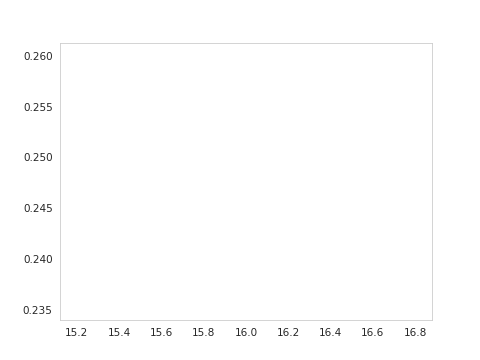

In [9]:
%matplotlib notebook
# max_components = 117
#Look at the errors Isomap gives
plt.plot(hyperparams_to_test['n_components'], errors_results['n_components'])

In [10]:
# # x, y = enumerate(errors['n_components'])
# %matplotlib notebook
# kneedle = KneeLocator(hyperparams_to_test['n_components'], errors_results['n_components'], S=1.0, curve='convex', direction='decreasing')#, interp_method='polynomial')\
# kneedle.plot_knee()
# plt.title(emb_method.__name__ + ' Errors')
# plt.xlabel('n_components')
# plt.ylabel('Isomap reconstruction error')
# kneedle.elbow

/home/rlevin/anaconda3/lib/python3.7/site-packages/kneed/knee_locator.py:108: RuntimeWarning: invalid value encountered in true_divide
  return (a - min(a)) / (max(a) - min(a))
/home/rlevin/anaconda3/lib/python3.7/site-packages/kneed/knee_locator.py:91: RuntimeWarning: Mean of empty slice.
  self.S * np.abs(np.diff(self.x_normalized).mean())
/home/rlevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/rlevin/anaconda3/lib/python3.7/site-packages/kneed/knee_locator.py:137: RuntimeWarning: No local maxima found in the difference curve
The line is probably not polynomial, try plotting
the difference curve with plt.plot(knee.x_difference, knee.y_difference)
Also check that you aren't mistakenly setting the curve argument
  RuntimeWarning,


<IPython.core.display.Javascript object>


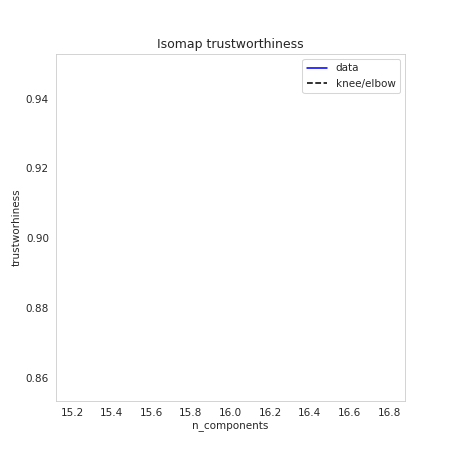

(None, None)

In [11]:
kneedle = KneeLocator(hyperparams_to_test['n_components'], np.array(trustws_results['n_components']), S=1, curve='concave', direction='increasing', interp_method='polynomial', online = False)
kneedle.plot_knee()
plt.title(emb_method.__name__  + ' trustworthiness')
plt.xlabel('n_components')
plt.ylabel('trustworhiness')
kneedle.knee, kneedle.knee_y
# online=True

In [12]:
#UNCOMMENT THIS!
# #Save the dataframe with optimal dim
# good_dim = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
# X_isomap = embeddings_results['n_components'][good_dim] #pick the best (knee point) n_components
# X_isomap_df = pd.DataFrame(X_isomap, columns = ['Mode {}'.format(i) for i in range(X_isomap.shape[1])])#, index = index_X)
# X_isomap_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/Isomap_'+ str(X_isomap.shape[1])+ 'D_' + STATE + '.csv')
# X_isomap_df.shape

In [13]:
#Save the dataframe with optimal dim
# good_dim = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
good_dim = 0
X_isomap = embeddings_results['n_components'][good_dim] #pick the best (knee point) n_components
X_isomap_df = pd.DataFrame(X_isomap, columns = ['Mode {}'.format(i) for i in range(X_isomap.shape[1])])#, index = index_X)
X_isomap_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/Isomap_'+ str(X_isomap.shape[1])+ 'D_' + STATE + '.csv')
X_isomap_df.shape

(4752, 16)

In [7]:
%%time
#Let's try Spectral Emdedding, will use trustworhiness to see how much local structure is retained
#The best parameters from the vizualization seem to be maybe 50 neighbors, let's try several n_components
emb_method = SpectralEmbedding
max_components = 117
hyperparams_to_test = {'n_components': [14]}# np.arange(2, max_components, 2)}

errors_results_SE, embeddings_results_SE, trustws_results_SE = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50,
 'n_components': 2,
 'n_jobs': -1})

#UNCOMMENT THE ABOVE!!!
# hyperparams_to_test = {'n_components': [14]}
# # colors = covid_clusters['x'].copy()

# errors_results_SE, embeddings_results_SE, trustws_results_SE = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50,
#  'n_components': 2,
#  'n_jobs': -1})

here
Trying n_components=14
CPU times: user 20.6 s, sys: 2.8 s, total: 23.4 s
Wall time: 9.65 s


In [9]:
save_obj(embeddings_results_SE, STATE + '_embeddings_results_SE')
save_obj(errors_results_SE, STATE + '_errors_results_SE')
save_obj(trustws_results_SE, STATE + '_trustws_results_SE')

In [10]:
# emb_method = SpectralEmbedding
# hyperparams_to_test = {'n_components': np.arange(2, 117, 2)}
# embeddings_results_SE = load_obj('embeddings_results_SE')
# errors_results_SE = load_obj('errors_results_SE')
# trustws_results_SE = load_obj('trustws_results_SE')

/home/rlevin/anaconda3/lib/python3.7/site-packages/kneed/knee_locator.py:108: RuntimeWarning: invalid value encountered in true_divide
  return (a - min(a)) / (max(a) - min(a))
/home/rlevin/anaconda3/lib/python3.7/site-packages/kneed/knee_locator.py:91: RuntimeWarning: Mean of empty slice.
  self.S * np.abs(np.diff(self.x_normalized).mean())
/home/rlevin/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/rlevin/anaconda3/lib/python3.7/site-packages/kneed/knee_locator.py:137: RuntimeWarning: No local maxima found in the difference curve
The line is probably not polynomial, try plotting
the difference curve with plt.plot(knee.x_difference, knee.y_difference)
Also check that you aren't mistakenly setting the curve argument
  RuntimeWarning,


(None, None)

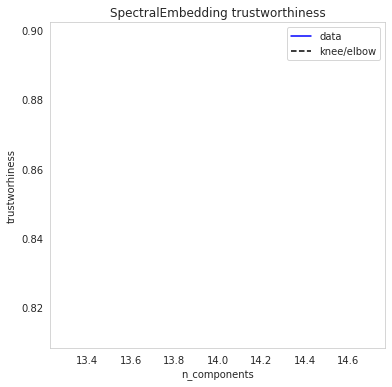

In [11]:
# max_components = 30
kneedle = KneeLocator(hyperparams_to_test['n_components'], np.array(trustws_results_SE['n_components']), S=1, curve='concave', direction='increasing', interp_method='polynomial')
kneedle.plot_knee()
plt.title(emb_method.__name__  + ' trustworthiness')
plt.xlabel('n_components')
plt.ylabel('trustworhiness')
kneedle.knee, kneedle.knee_y

In [12]:
# #Save the dataframe with optimal dim
# good_dim_SE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
# X_SE = embeddings_results['n_components'][good_dim_SE] #pick the best (knee point) n_components
# X_SE_df = pd.DataFrame(X_SE, columns = ['Mode {}'.format(i) for i in range(X_SE.shape[1])])#, index = index_X)
# X_SE_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/SE_' + str(X_SE.shape[1]) + 'D_' + STATE + '.csv')
# X_SE_df.shape

In [15]:
#Save the dataframe with optimal dim
# good_dim_SE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
good_dim_SE = 0
X_SE = embeddings_results_SE['n_components'][good_dim_SE] #pick the best (knee point) n_components
X_SE_df = pd.DataFrame(X_SE, columns = ['Mode {}'.format(i) for i in range(X_SE.shape[1])])#, index = index_X)
X_SE_df.to_csv(os.path.join(DATA_PATH, 'interim', 'SE_' + str(X_SE.shape[1]) + 'D_' + STATE + '.csv'))
X_SE_df.shape

(5510, 14)

In [ ]:
%%time
#LLE
emb_method = LocallyLinearEmbedding
hyperparams_to_test = {'n_components': np.arange(2, 117, 2)}


errors_results_LLE, embeddings_results_LLE, trustws_results_LLE  = choose_dimension(X, emb_method, hyperparams_to_test, '',**{'n_neighbors': 200,
 'n_components': 2,
 'reg': 0.1, #Note here that we later ended up using reg 0.1, so setting it
 'eigen_solver': 'auto',
 'tol': 1e-06,
 'max_iter': 1000,
 'method': 'standard',
 'hessian_tol': 0.0001,
 'modified_tol': 1e-12,
 'neighbors_algorithm': 'auto',
 'random_state': None,
 'n_jobs': -1})

# #Uncomment the above!!!
# hyperparams_to_test = {'n_components': [14]}
# # colors = covid_clusters['x'].copy()

# errors_results_LLE, embeddings_results_LLE, trustws_results_LLE  = choose_dimension(X, emb_method, hyperparams_to_test, '',**{'n_neighbors': 200,
#  'n_components': 2,
#  'reg': 0.1, #Note here that we later ended up using reg 0.1, so setting it
#  'eigen_solver': 'auto',
#  'tol': 1e-06,
#  'max_iter': 1000,
#  'method': 'standard',
#  'hessian_tol': 0.0001,
#  'modified_tol': 1e-12,
#  'neighbors_algorithm': 'auto',
#  'random_state': None,
#  'n_jobs': -1})

In [36]:
save_obj(embeddings_results_LLE, 'embeddings_results_LLE')
save_obj(errors_results_LLE, 'errors_results_LLE')
save_obj(trustws_results_LLE, 'trustws_results_LLE')

In [32]:
emb_method = LocallyLinearEmbedding
hyperparams_to_test = {'n_components': np.arange(2, 117, 2)}
embeddings_results_LLE = load_obj('embeddings_results_LLE')
errors_results_LLE = load_obj('errors_results_LLE')
trustws_results_LLE = load_obj('trustws_results_LLE')

<IPython.core.display.Javascript object>


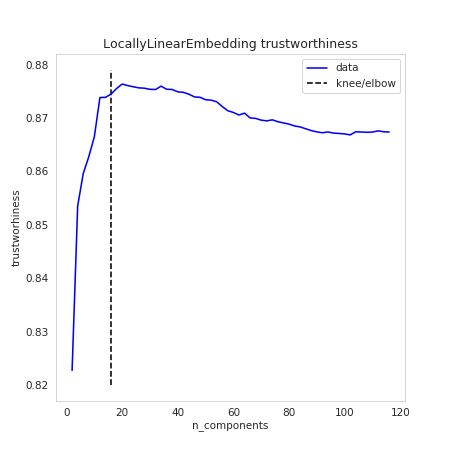

(16, 0.874457904844481)

In [33]:
kneedle = KneeLocator(np.arange(2, 117, 2), np.array(trustws_results_LLE['n_components']), S=1, curve='concave', direction='increasing', interp_method='polynomial')
kneedle.plot_knee()
plt.title(emb_method.__name__  + ' trustworthiness')
plt.xlabel('n_components')
plt.ylabel('trustworhiness')
kneedle.knee, kneedle.knee_y

In [34]:
# #Save the dataframe with optimal dim
# good_dim_LLE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
# X_LLE = embeddings_results['n_components'][good_dim_LLE] #pick the best (knee point) n_components
# X_LLE_df = pd.DataFrame(X_LLE, columns = ['Mode {}'.format(i) for i in range(X_LLE.shape[1])])#, index = index_X)
# X_LLE_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/LLE_' + str(X_LLE.shape[1]) + 'D_' + STATE + '.csv')
# X_LLE_df.shape

In [35]:
good_dim_LLE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
X_LLE = embeddings_results_LLE['n_components'][good_dim_LLE] #pick the best (knee point) n_components
X_LLE_df = pd.DataFrame(X_LLE, columns = ['Mode {}'.format(i) for i in range(X_LLE.shape[1])])#, index = index_X)
X_LLE_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/LLE_' + str(X_LLE.shape[1]) + 'D_' + STATE + '.csv')
X_LLE_df.shape

(15719, 16)

## Visualize SE, Isomap, LLE

In [9]:
FIGURE_PATH

'/mnt/c/Users/rlevin/Documents/notebooks/covid-mobility-and-behavior/reports/figures/GA'

2D Args: {'n_neighbors': 50, 'n_components': 2, 'n_jobs': -1}
3D Args: {'n_neighbors': 50, 'n_components': 3, 'n_jobs': -1}


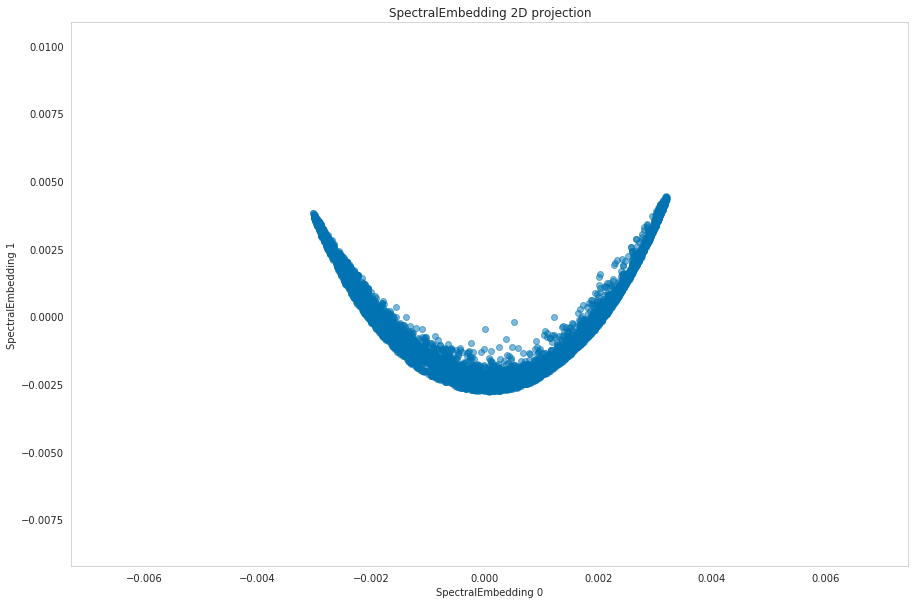

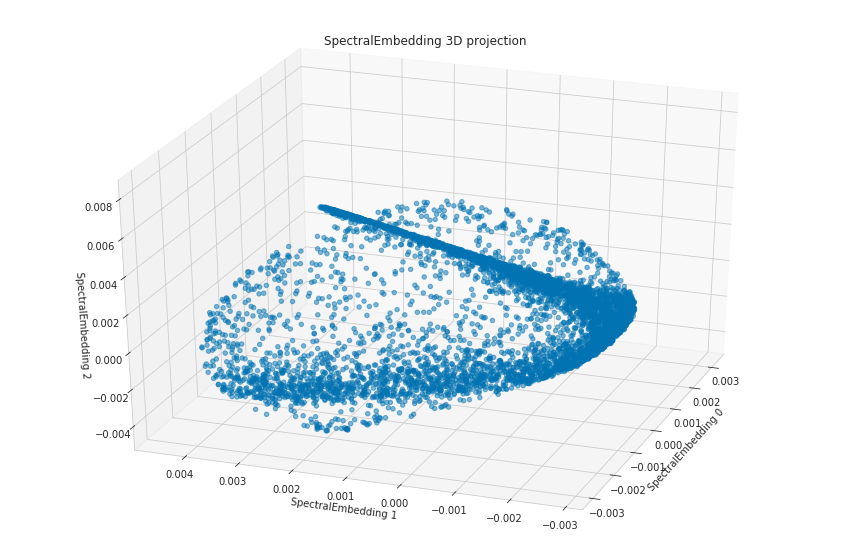

In [8]:
#Viz clustering on the emb
# filename_SE_clustering = FIGURES_ADDITIONAL_PATH + 'clustering'
# %%matplotlib notebook
%matplotlib inline

filename_initial_SE = os.path.join(FIGURE_PATH, 'initial_SE')
X_2D_SE, X_3D_SE = viz_SE(X, colors = None, filename = filename_initial_SE, alpha = 0.5)
cos_colors = find_cos_similarity(X_2D_SE)

2D Args: {'n_neighbors': 50, 'n_components': 2, 'n_jobs': -1}
3D Args: {'n_neighbors': 50, 'n_components': 3, 'n_jobs': -1}


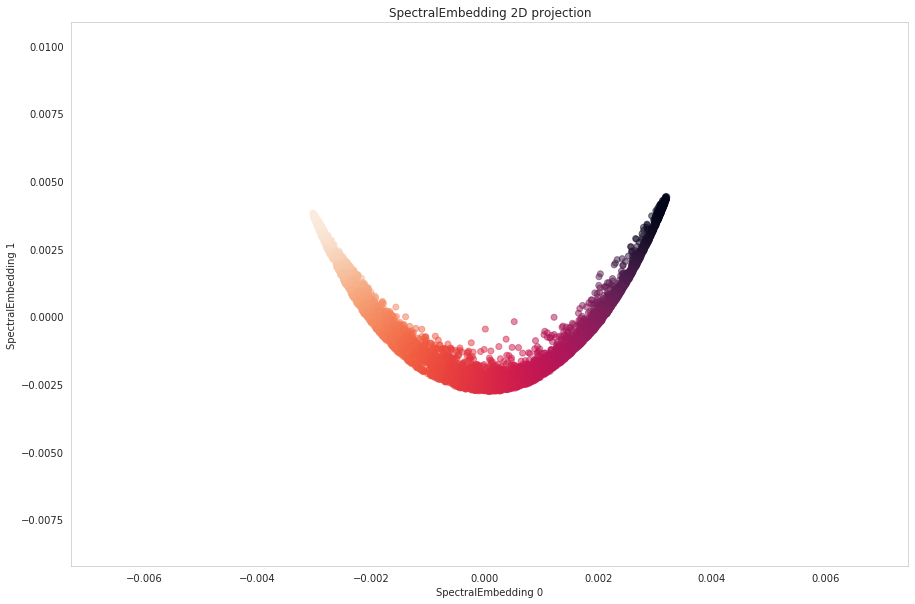

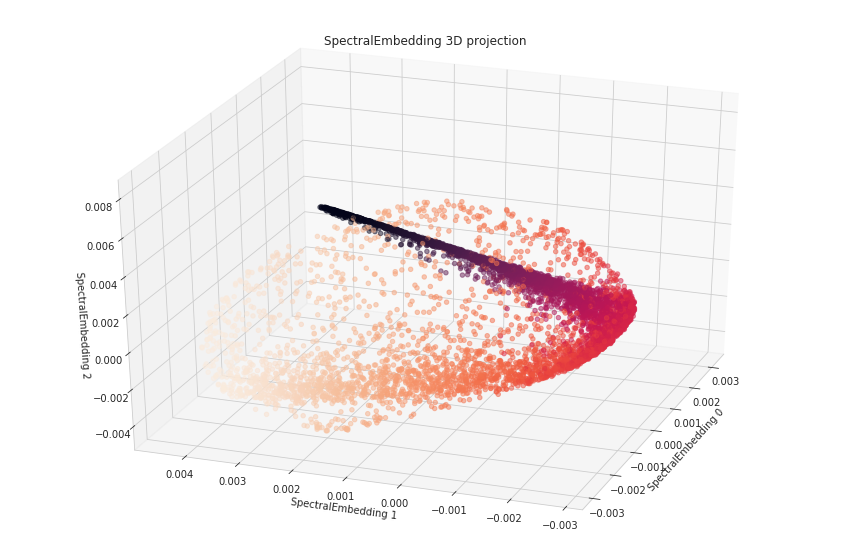

In [10]:
filename_initial_SE_colored = os.path.join(FIGURE_PATH, 'initial_SE_colored')
X_2D_SE, X_3D_SE = viz_SE(X, colors = cos_colors, filename = filename_initial_SE_colored, cbar = None, alpha = 0.5)

2D Args: {'n_neighbors': 50, 'n_components': 2, 'max_iter': 1000, 'n_jobs': -1}
3D Args: {'n_neighbors': 50, 'n_components': 3, 'max_iter': 1000, 'n_jobs': -1}


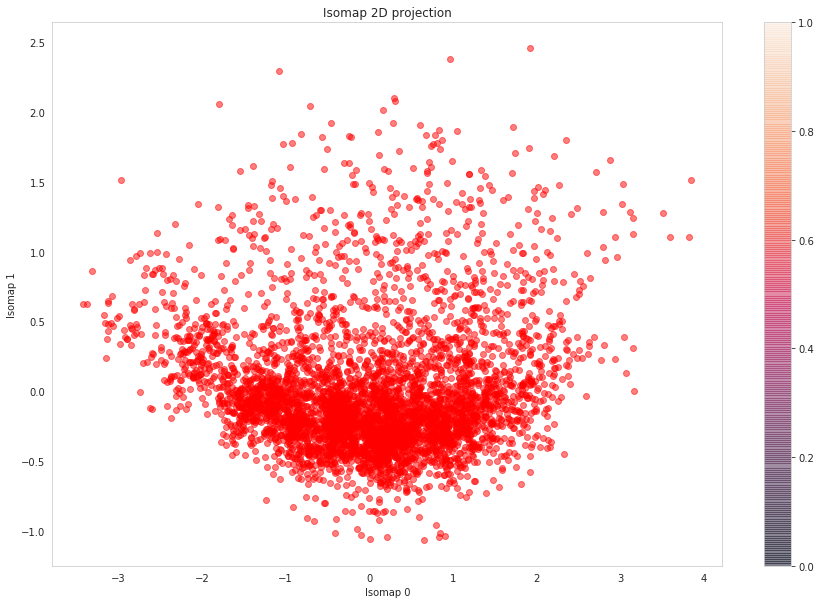

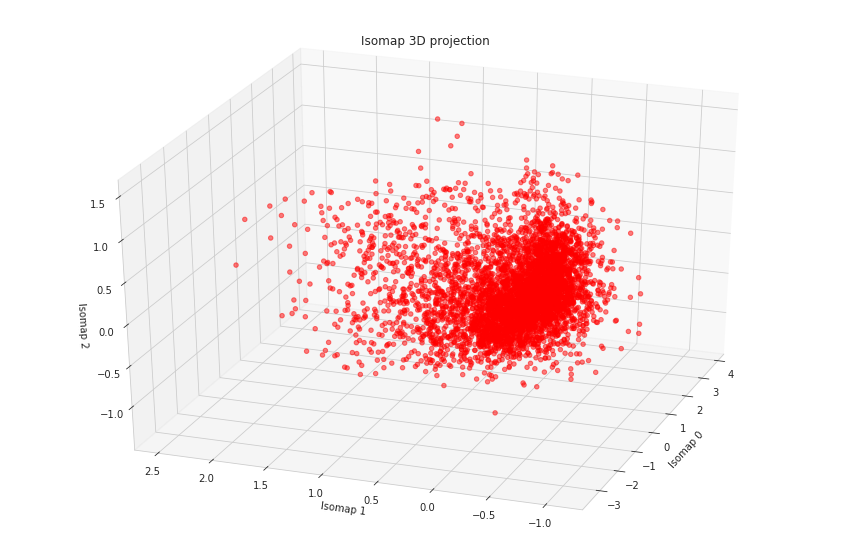

In [33]:
_ = viz_Isomap(X, 'red', filename = None, alpha = 0.5)

2D Args: {'n_neighbors': 200, 'n_components': 2, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}
3D Args: {'n_neighbors': 200, 'n_components': 3, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}


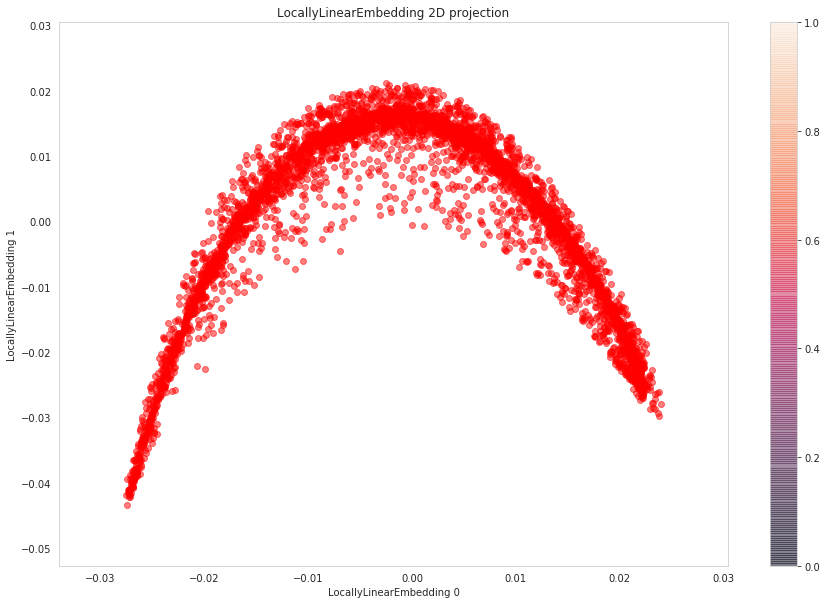

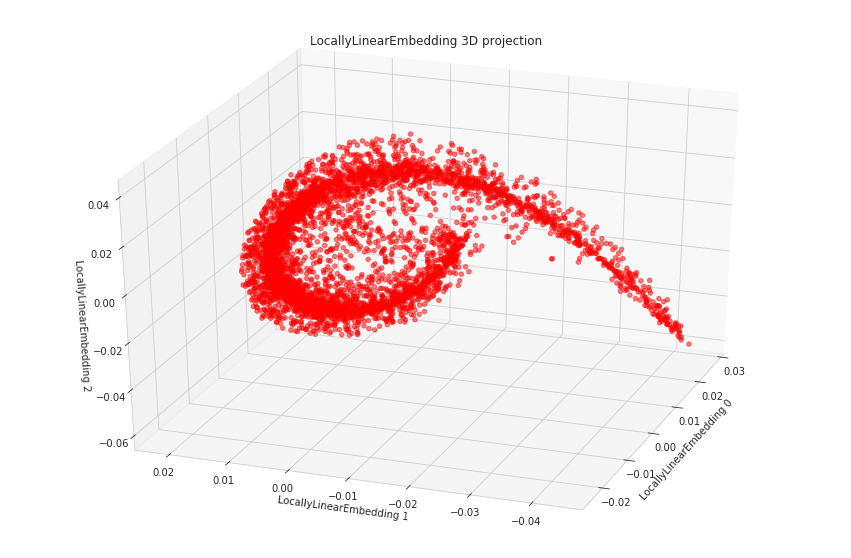

In [34]:
_ = viz_LLE(X, 'red', filename = None, alpha = 0.5)

## GMM clustering in R

In [16]:
# ro.r('install.packages("mclust")')
base = importr('base')
mclust = importr('mclust')
ro.r('set.seed(0)')

<rpy2.rinterface_lib.sexp.NULLType object at 0x7fe4e792adc0> [RTYPES.NILSXP]

In [17]:
def GMM_clustering_R(X_SE_df, method, default_cluster_num = None):
    """Function to check BIC and perform GMM clustering on embedded dataset"""
    #First, import r packages and fix random seed:
    base = importr('base')
    mclust = importr('mclust')
    ro.r('set.seed(0)')
    
    #Now, check BIC and make a plot
    num_components_to_try = pd.Series(np.arange(1,12)) #try up to 12 components
    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.r('set.seed(0)')
        BIC_SE = mclust.mclustBIC(X_SE_df, G = num_components_to_try)
    
    model_names = ['EII', 'VII', 'EEI', 'VEI', 'EVI', 'VVI', 'EEE', 'EVE', 'VEE', 'VVE', 'EEV', 'VEV', 'EVV', 'VVV']
    sns.set(style="darkgrid")
    sns.set_palette("tab10")
    BIC_SE_df = pd.DataFrame(BIC_SE, columns = model_names)
#     plt.figure()
    BIC_SE_df.plot(marker = 'o')
    plt.title('GMM BIC on ' + method.__name__)
    
    #Now, find the knee point of the optimal BIC plot (the best GMM parametrization)
    best_parametrization = BIC_SE_df.columns[BIC_SE_df.max().argmax()]
    kneedle = KneeLocator(num_components_to_try, BIC_SE_df[best_parametrization], S=1, curve='concave', direction='increasing', interp_method='interp1d')
#     plt.figure()
    kneedle.plot_knee()
    plt.title('GMM BIC on ' + method.__name__ + ': Knee Point')
    plt.xlabel('num_GMM_components')
    plt.ylabel('')
    print('Elbow point: {} components with BIC {}'.format(kneedle.knee, kneedle.knee_y))
    
    #Pick the best number of GMM components:
    best_num_components = kneedle.knee-1
    if default_cluster_num is not None:
        best_num_components = default_cluster_num-1
    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.r('set.seed(0)')
        mc = mclust.Mclust(X_SE_df, G = pd.Series([num_components_to_try[best_num_components]]))
        print(base.summary(mc))
        print(np.quantile(mc[15], [0, 0.25, 0.5, 0.75, 1]))
        mc_dict = convert_to_python_dict(mc)
        SE_model_name = mc_dict['modelName']
        print(SE_model_name)
        param = mc_dict['parameters']
        SE_means = np.array(convert_to_python_dict(param)['mean'])
        SE_uncertainty = np.array(mc_dict['uncertainty'])
        SE_z = np.array(convert_to_python_dict(mc)['z'])
        SE_clusters = np.array(convert_to_python_dict(mc)['classification'])
        SE_means = pd.DataFrame(SE_means, columns = ['V'+str(i+1) for i in range(SE_means.shape[1])])
#         np.array(mc[14])
#         SE_means = np.array(mc[12][1])
    return SE_clusters, SE_means, SE_z, SE_uncertainty

fitting ...
  |======================================================================| 100%
Elbow point: 5 components with BIC 1105333.5637084162
fitting ...
  |======================================================================| 100%
---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 5
components: 

 log-likelihood    n  df     BIC     ICL
       555246.8 5510 599 1105334 1105307

Clustering table:
   1    2    3    4    5 
 960 1177 1577  647 1149 

[0.00000000e+00 0.00000000e+00 0.00000000e+00 4.38538095e-14
 4.92285983e-01]
['VVV']


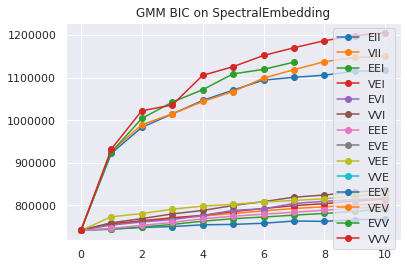

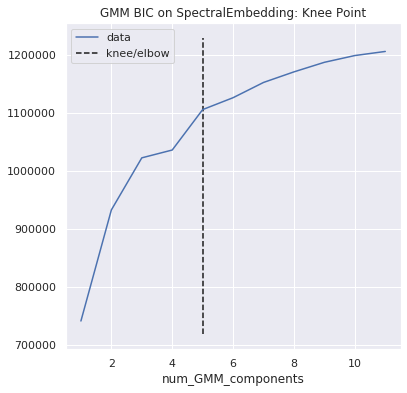

In [18]:
SE_clusters, SE_means, SE_z, SE_uncertainty = GMM_clustering_R(X_SE_df, SpectralEmbedding, default_cluster_num=5)
SE_clusters_block_indexed = pd.Series(SE_clusters, index = index_X)

fitting ...
  |======================================================================| 100%


/home/rlevin/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<IPython.core.display.Javascript object>


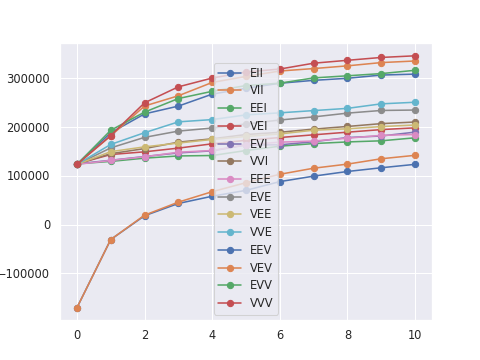

/home/rlevin/anaconda3/lib/python3.7/site-packages/kneed/knee_locator.py:246: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


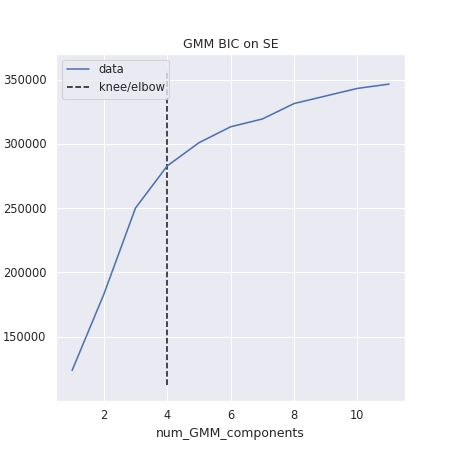

Elbow point: 4 components with BIC 282816.4121341074
fitting ...
  |======================================================================| 100%
---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 4
components: 

 log-likelihood     n  df      BIC      ICL
       144360.1 15719 611 282816.4 281726.9

Clustering table:
   1    2    3    4 
4742 3691 3584 3702 

[0.00000000e+00 1.60375679e-09 9.75146678e-06 2.81601511e-03
 5.95627541e-01]
['VVV']


In [65]:
isomap_clusters, isomap_means, isomap_z, isomap_uncertainty = GMM_clustering_R(X_isomap_df, Isomap)
isomap_clusters_block_indexed = pd.Series(isomap_clusters, index = index_X)

fitting ...
  |======================================================================| 100%


/home/rlevin/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<IPython.core.display.Javascript object>


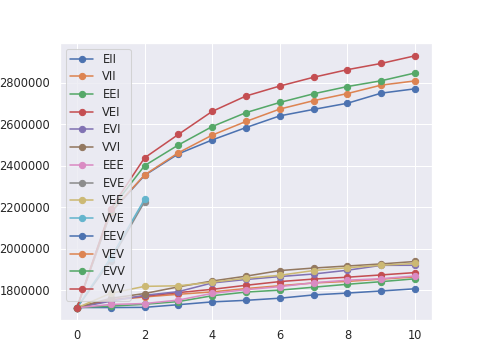

/home/rlevin/anaconda3/lib/python3.7/site-packages/kneed/knee_locator.py:246: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


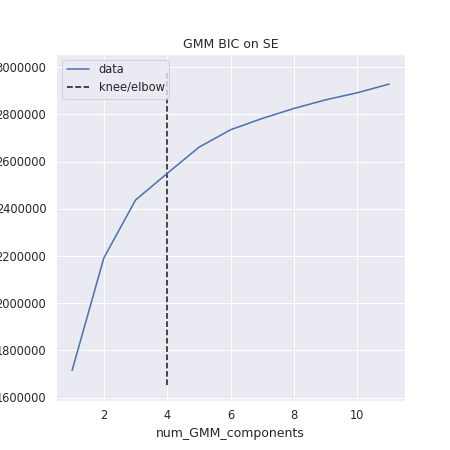

Elbow point: 4 components with BIC 2550106.756804902
fitting ...
  |======================================================================| 100%
---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 4
components: 

 log-likelihood     n  df     BIC     ICL
        1278005 15719 611 2550107 2549928

Clustering table:
   1    2    3    4 
4503 4766 2196 4254 

[0.00000000e+00 0.00000000e+00 0.00000000e+00 2.18713936e-13
 5.67680706e-01]
['VVV']


In [66]:
# LLE_clusters, LLE_means, LLE_z, LLE_uncertainty = GMM_clustering_R(X_LLE_df)
LL_clusters_block_indexed = pd.Series(LLE_clusters, index = index_X)

### Interpretability: Centroids, Map, Embedding

In [41]:
#Start with LLE
# LLE_means = pd.DataFrame(LLE_means, columns = ['V'+str(i+1) for i in range(LLE_means.shape[1])])
LLE_means.head(2)

,V1,V2,V3,V4
0,0.008953,-0.001717,0.001513,-0.010598
1,0.006069,-0.003227,-0.008671,0.004984


In [42]:
N_TIMESERIES = 5
FIGURES_ADDITIONAL_PATH = 'exploratory/covid/interpretability/' + STATE
closest_to_mean_samples, closest_to_mean_block_ids = find_closest_time_series(X_LLE_df, LLE_means, covid_ga_, n = N_TIMESERIES)
closest_to_mean_samples['V4'].shape
#CREATE SUBFOLDER FOR EACH METHOD THROUGH PYTHON!

(5, 117)

<IPython.core.display.Javascript object>


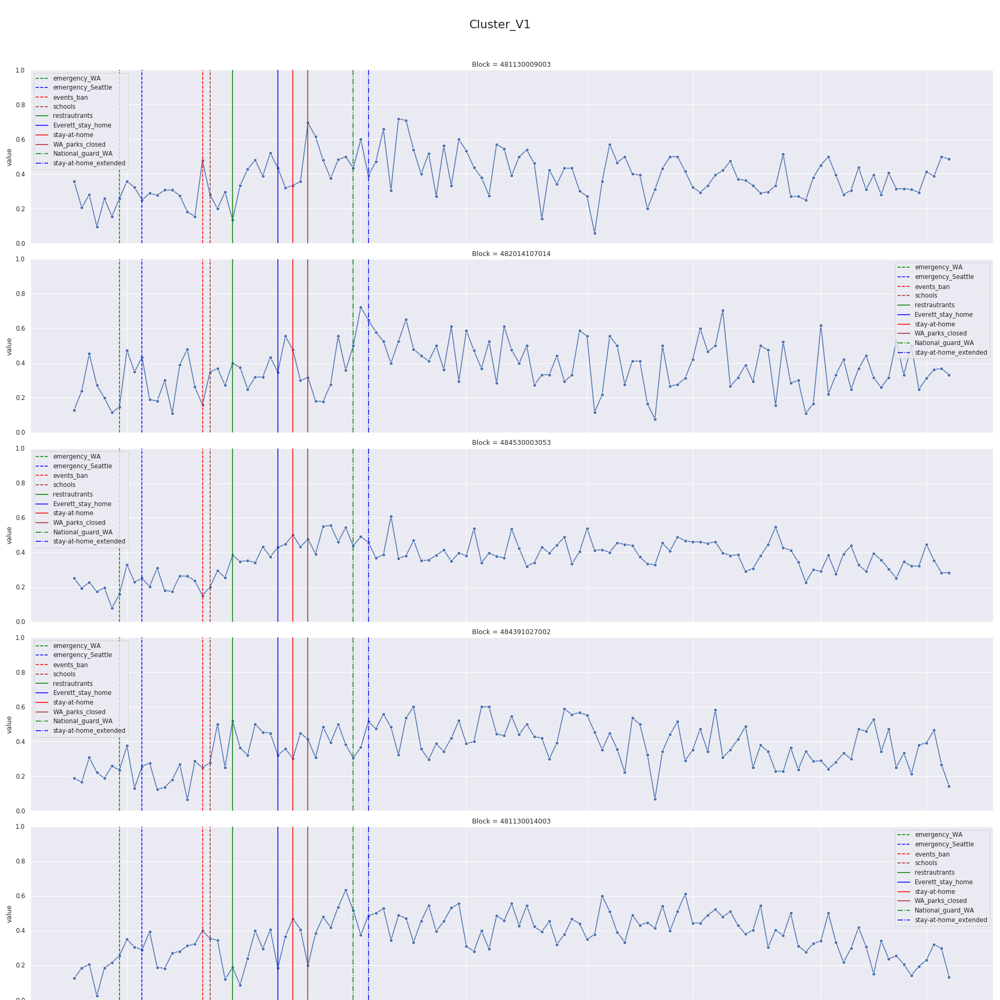

<IPython.core.display.Javascript object>


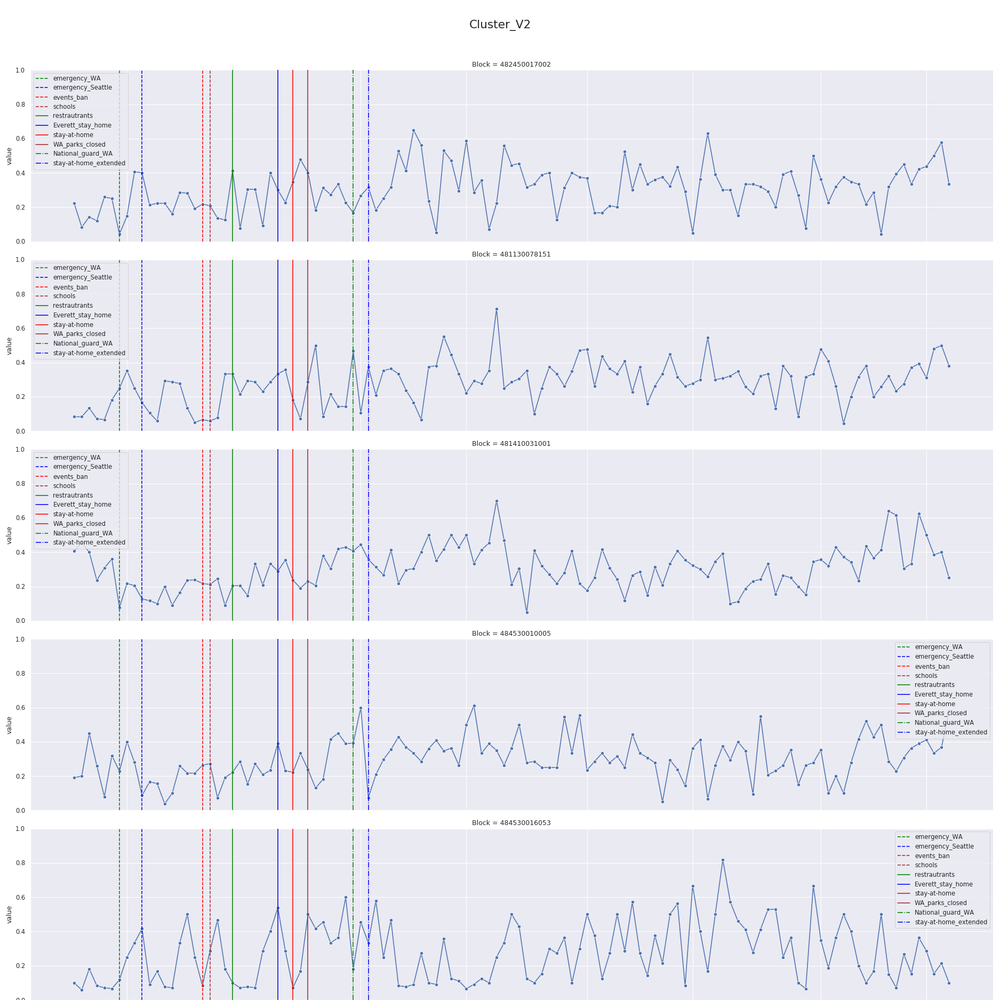

<IPython.core.display.Javascript object>


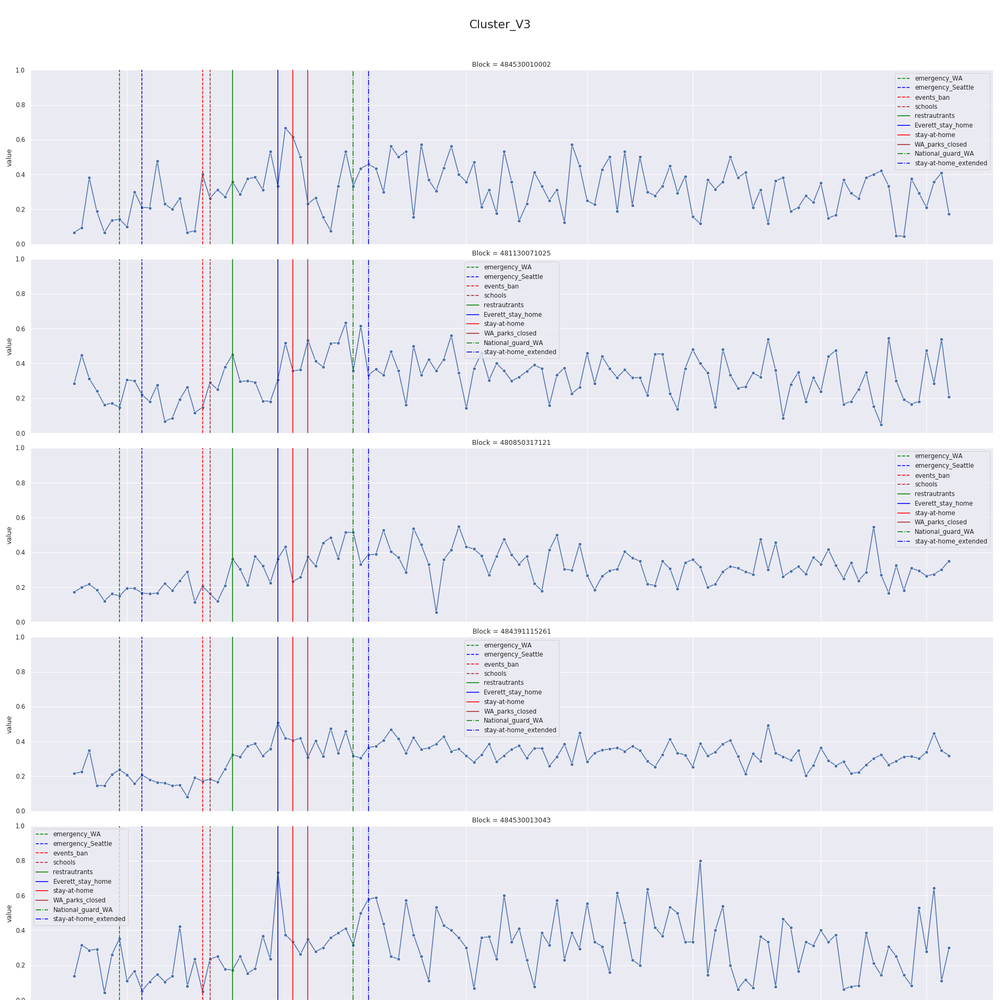

<IPython.core.display.Javascript object>


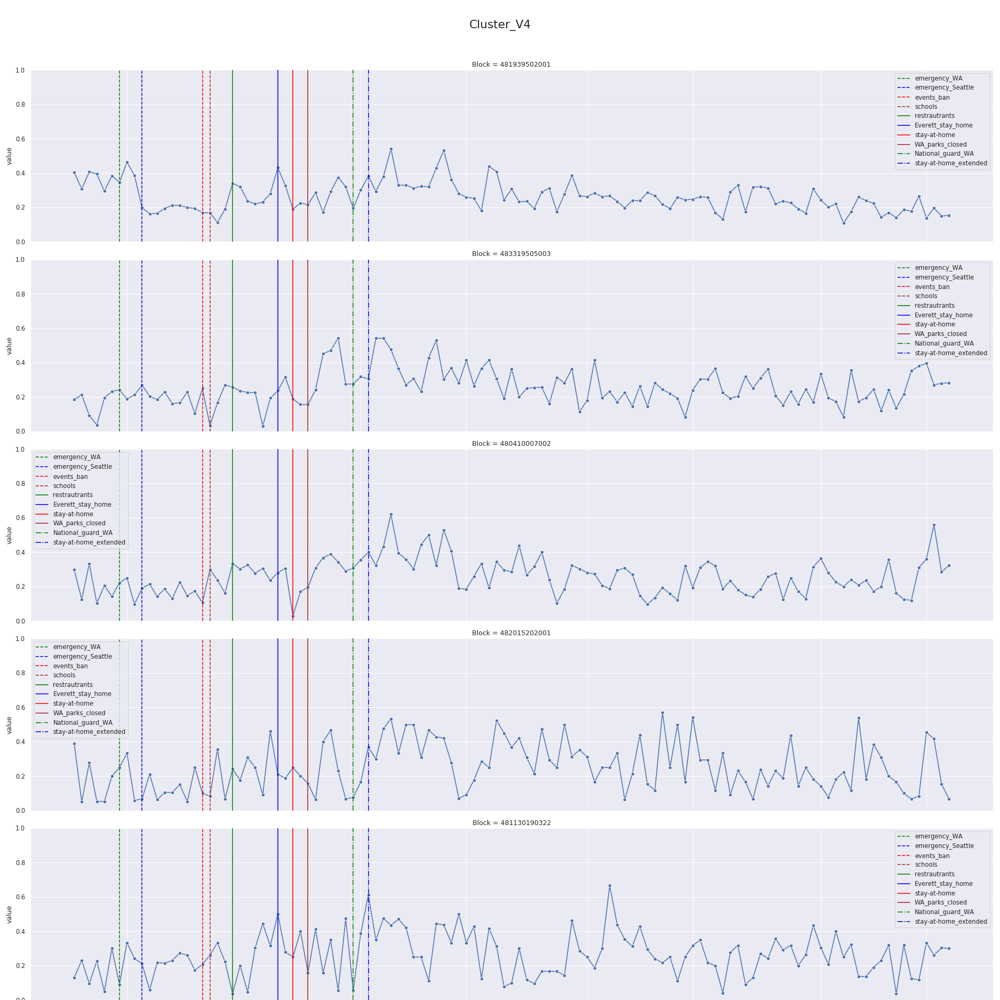

In [43]:
#Look at the closest time series
for cluster in LLE_means.columns:   
    filename_ts_plot = FIGURES_ADDITIONAL_PATH + 'LLE_closest_time_series_'+cluster+'.png'
    plot_time_series(closest_to_mean_samples[cluster], 'Cluster_'+cluster, filename = filename_ts_plot)

/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


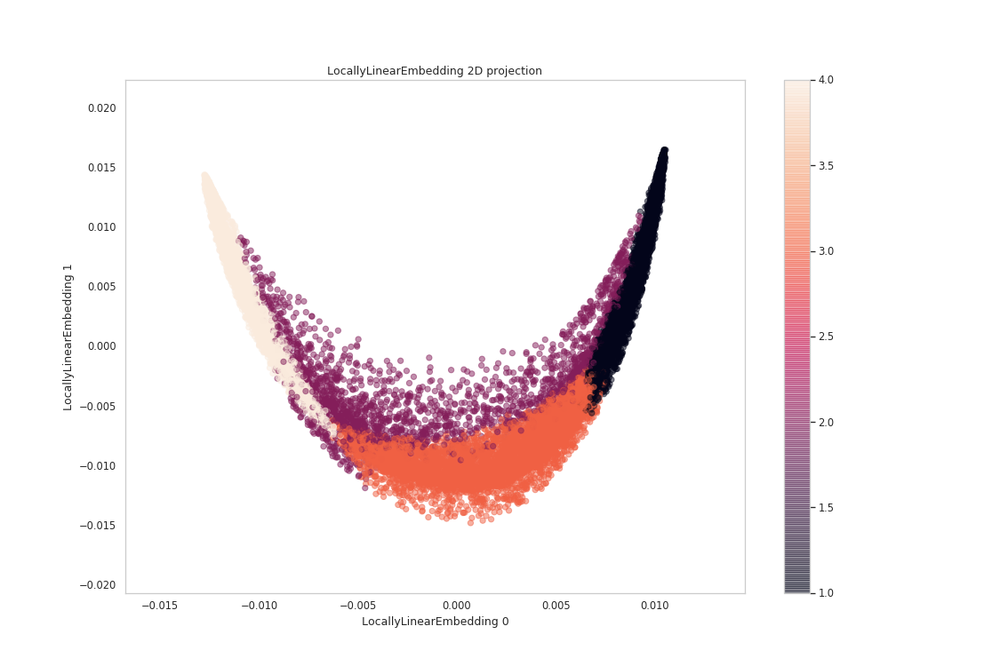

2D Args: {'n_neighbors': 200, 'n_components': 2, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}


/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


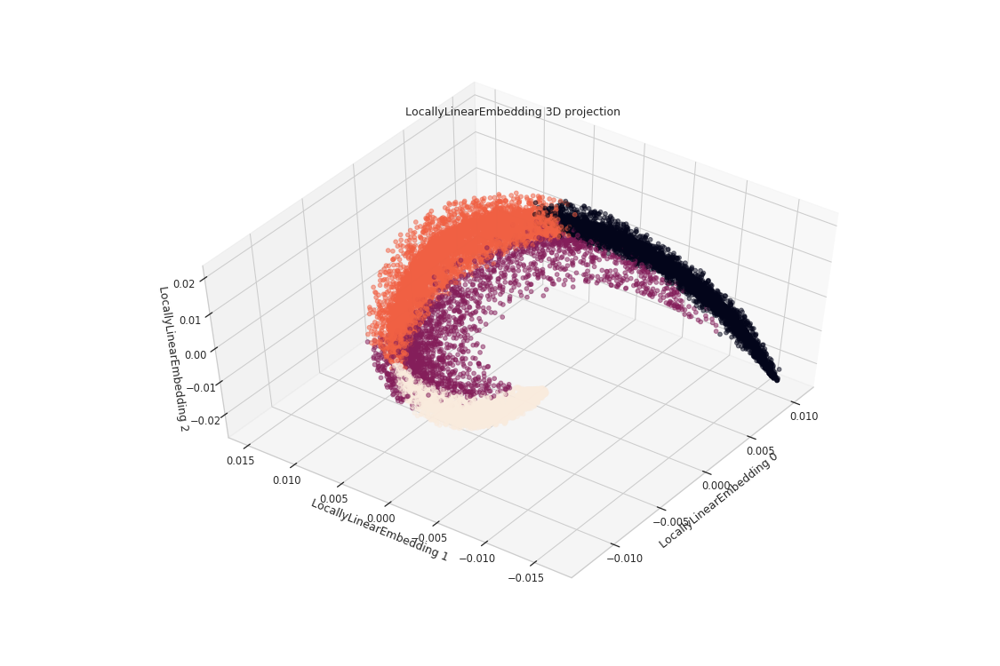

3D Args: {'n_neighbors': 200, 'n_components': 3, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}


In [44]:
%matplotlib inline
#Viz on the emb
#CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
filename_LLE_clustering = FIGURES_ADDITIONAL_PATH + 'LLE_clustering'
X_2D_LLE, X_3D_LLE = viz_LLE(X, LLE_clusters, filename = filename_LLE_clustering, alpha = 0.5)

/home/rlevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:165: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


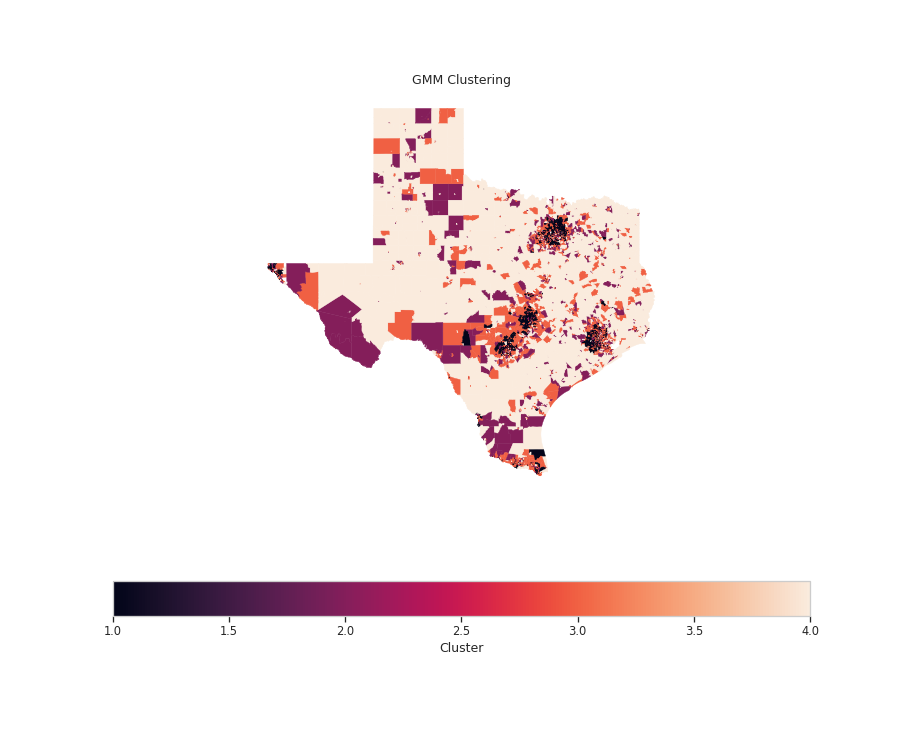

In [46]:
# #Viz clustering on the map
filename_LLE_clustering_map = FIGURES_ADDITIONAL_PATH + 'LLE_clustering_map'
viz_cluster_map(LLE_clusters, index_X, filename = filename_LLE_clustering_map)

In [47]:
#Now Isomap
# isomap_means = pd.DataFrame(isomap_means, columns = ['V'+str(i+1) for i in range(isomap_means.shape[1])])
isomap_means.head(2)

,V1,V2,V3,V4
0,-0.175613,1.343469,-1.329175,0.227147
1,-0.134418,-0.168430,-0.140039,0.488263


In [48]:
N_TIMESERIES = 5
FIGURES_ADDITIONAL_PATH = 'exploratory/covid/interpretability/' + STATE
closest_to_mean_samples, closest_to_mean_block_ids = find_closest_time_series(X_isomap_df, isomap_means, covid_ga_, n = N_TIMESERIES)
closest_to_mean_samples['V4'].shape

(5, 117)

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


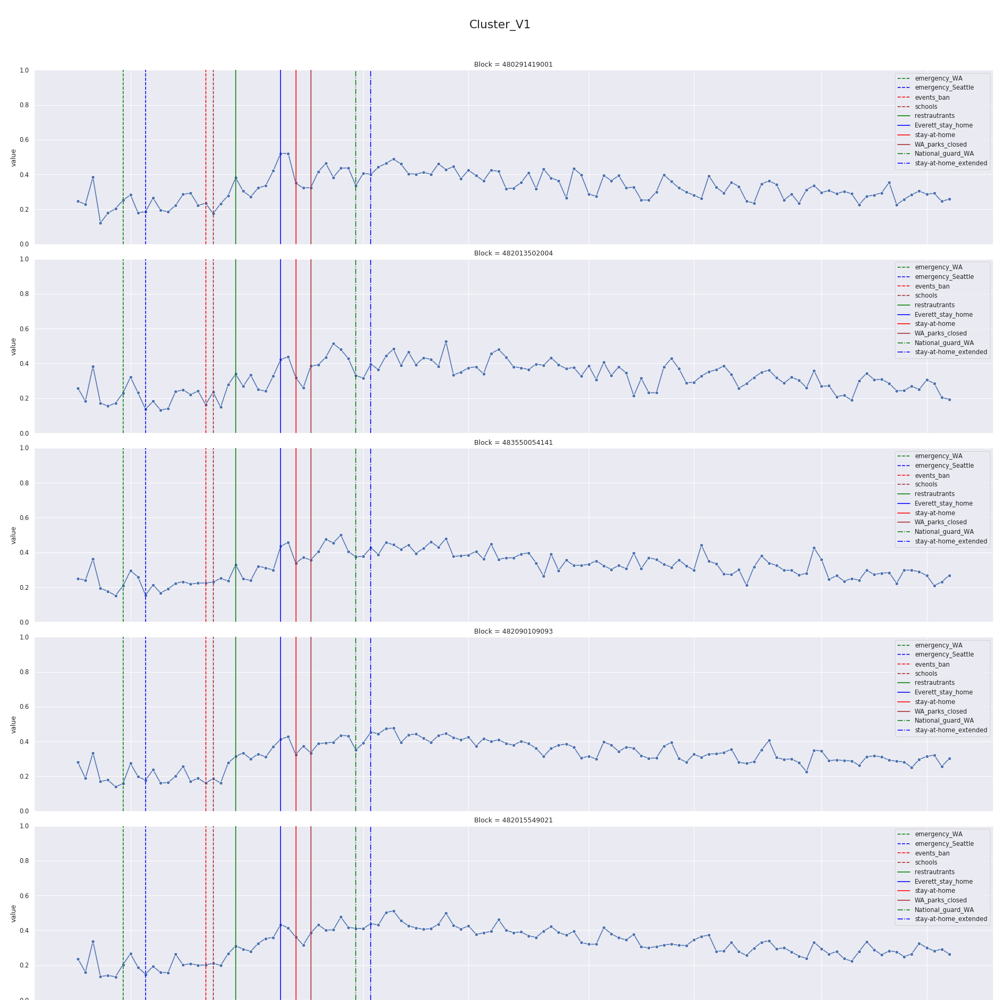

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


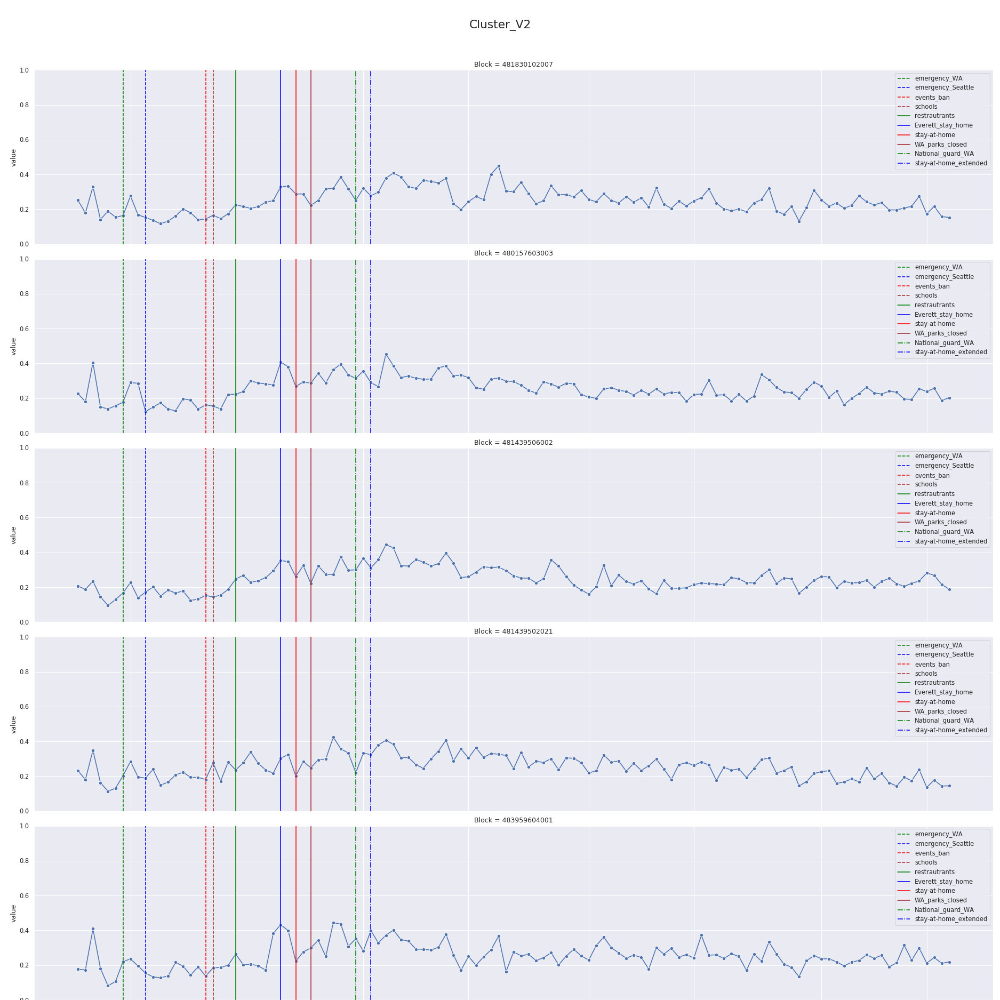

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


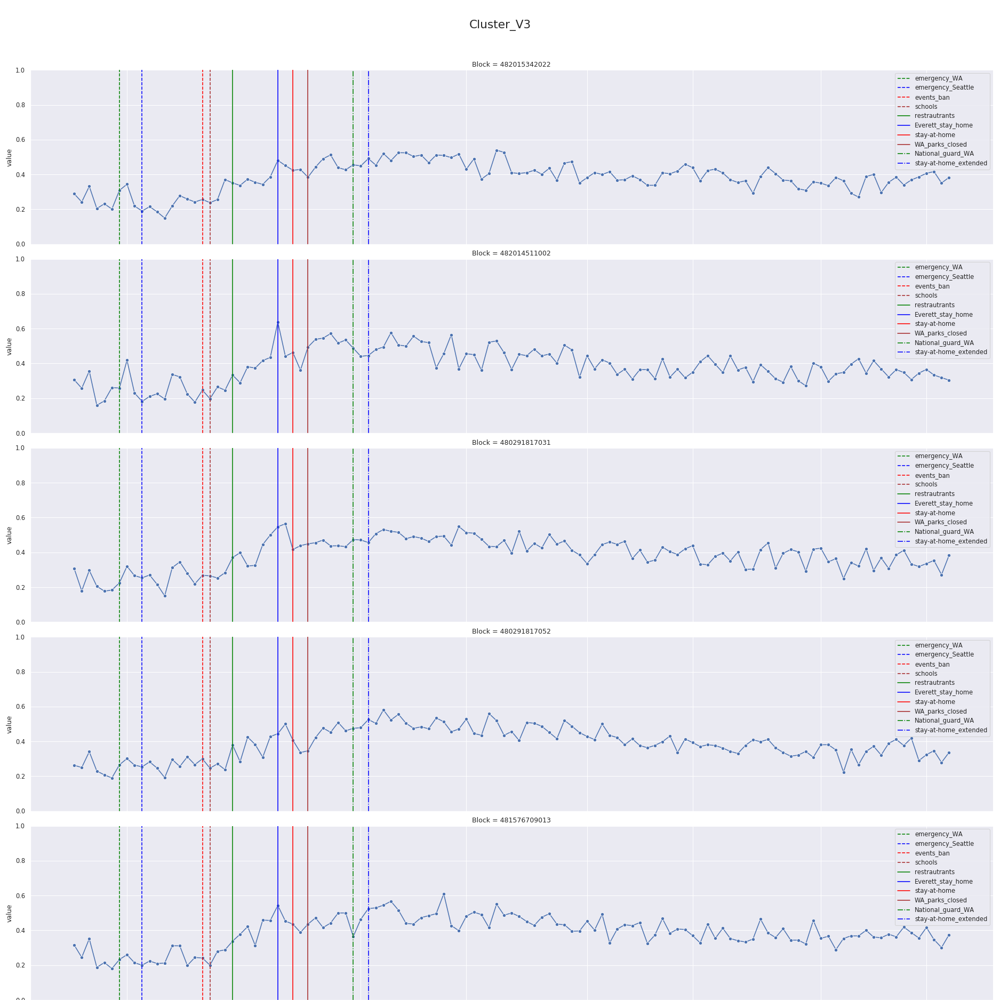

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


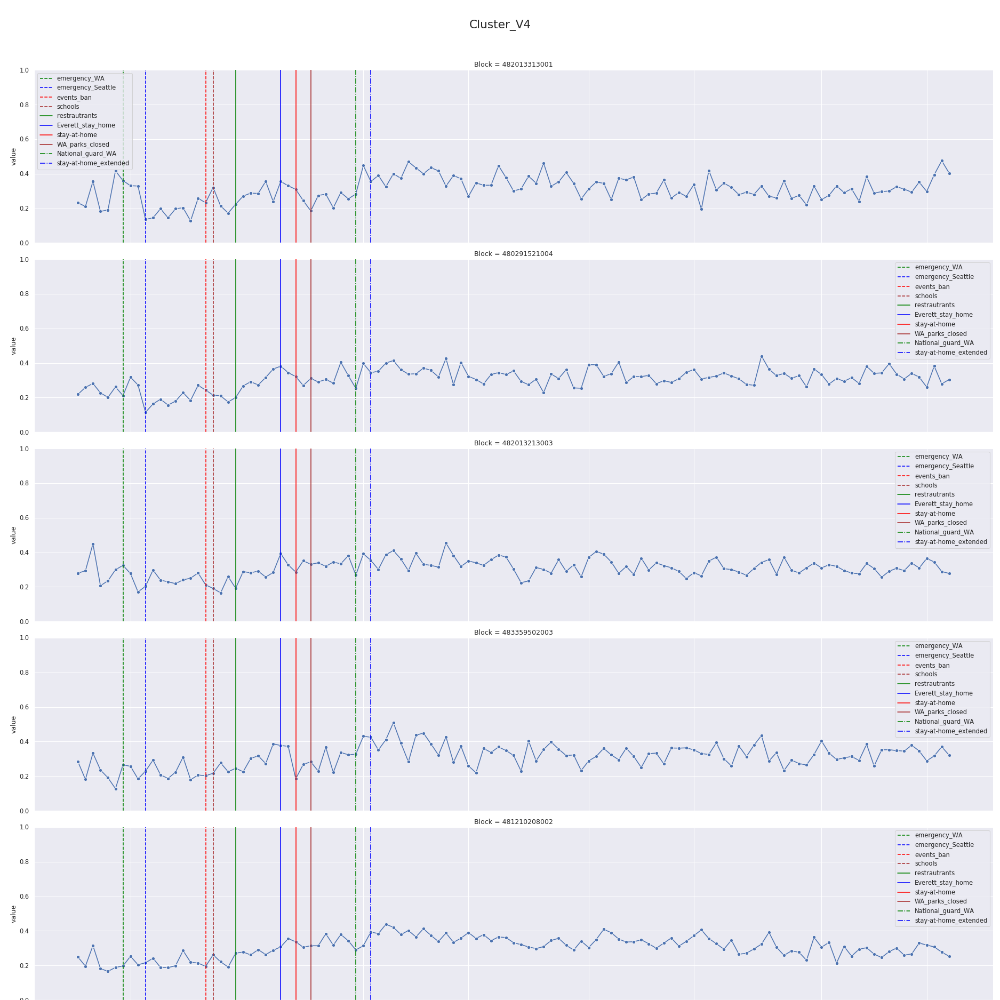

In [49]:
#Look at the closest time series
for cluster in isomap_means.columns:   
    filename_ts_plot = FIGURES_ADDITIONAL_PATH + 'isomap_closest_time_series_'+cluster+'.png'
    plot_time_series(closest_to_mean_samples[cluster], 'Cluster_'+cluster, filename = filename_ts_plot)

/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


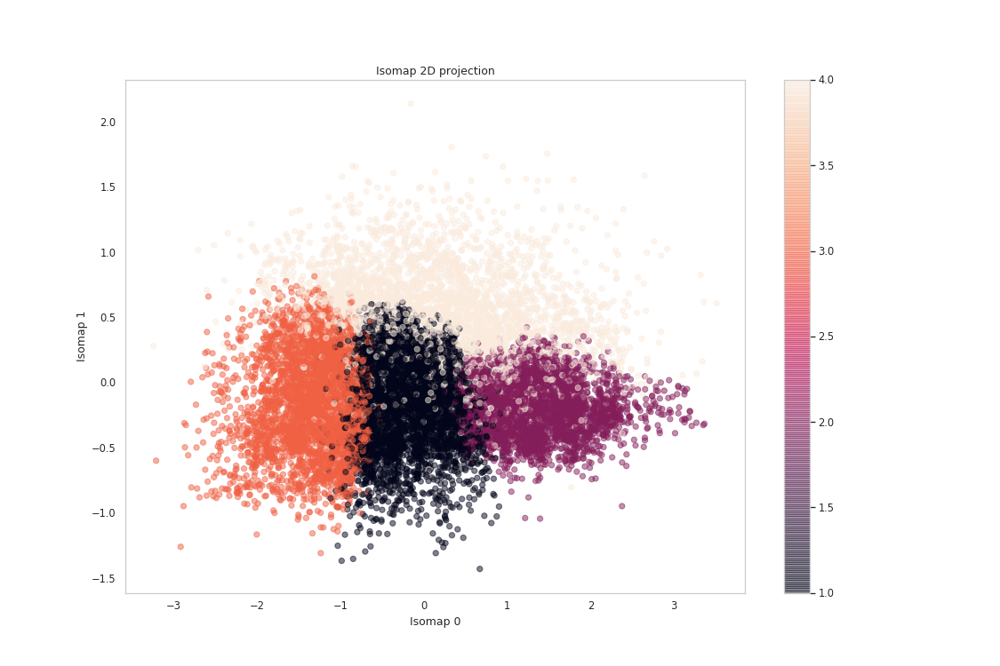

2D Args: {'n_neighbors': 50, 'n_components': 2, 'max_iter': 1000, 'n_jobs': -1}


/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


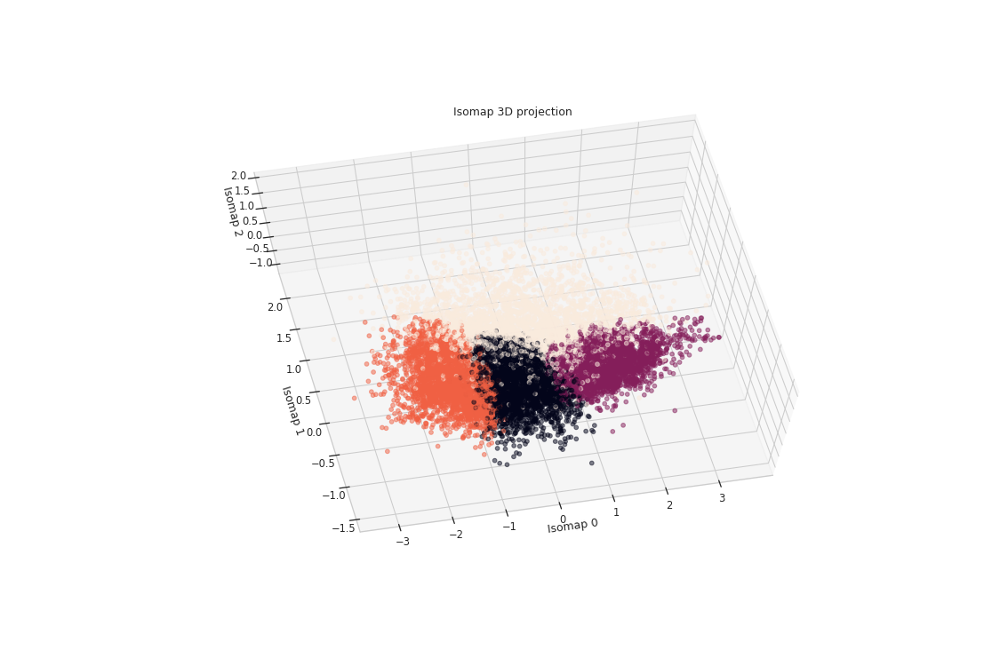

3D Args: {'n_neighbors': 50, 'n_components': 3, 'max_iter': 1000, 'n_jobs': -1}


In [50]:
#Viz on the emb
#CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
filename_isomap_clustering = FIGURES_ADDITIONAL_PATH + 'isomap_clustering'
X_2D_isomap, X_3D_isomap = viz_Isomap(X, isomap_clusters, filename = filename_isomap_clustering, alpha = 0.5)

/home/rlevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:165: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


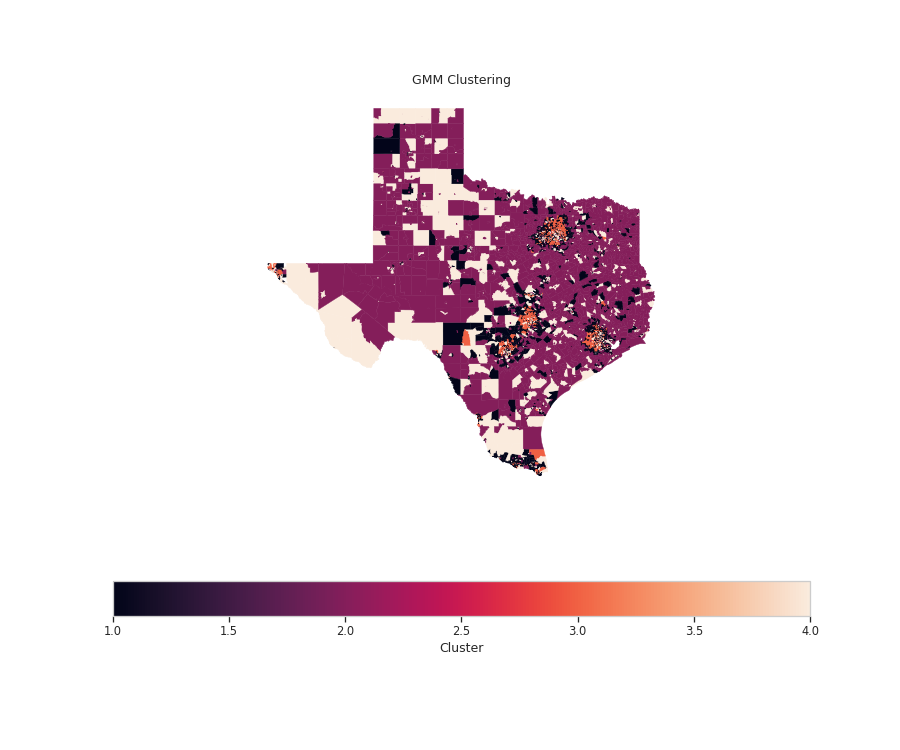

In [51]:
# #Viz clustering on the map
filename_isomap_clustering_map = FIGURES_ADDITIONAL_PATH + 'isomap_clustering_map'
viz_cluster_map(isomap_clusters, index_X, filename = filename_isomap_clustering_map)

In [328]:
# #Viz on the emb
# #CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
# filename_isomap_clustering = FIGURES_ADDITIONAL_PATH + 'isomap_clustering_SE_viz'
# _ = viz_SE(X_isomap_df.values, isomap_clusters, filename = filename_isomap_clustering, alpha = 0.5)

In [19]:
#last, SE

# SE_means = pd.DataFrame(SE_means, columns = ['V'+str(i+1) for i in range(SE_means.shape[1])])
SE_means.head(2)

,V1,V2,V3,V4,V5
0,0.002700,0.001518,-0.002293,-0.000737,-0.000257
1,0.002212,-0.000977,0.001262,-0.000629,-0.002139


In [20]:
N_TIMESERIES = 5
FIGURES_ADDITIONAL_PATH = 'exploratory/covid/interpretability/' + STATE
closest_to_mean_samples, closest_to_mean_block_ids = find_closest_time_series(X_SE_df, SE_means, covid_ga_, n = N_TIMESERIES)
closest_to_mean_samples['V4'].shape

(5, 117)

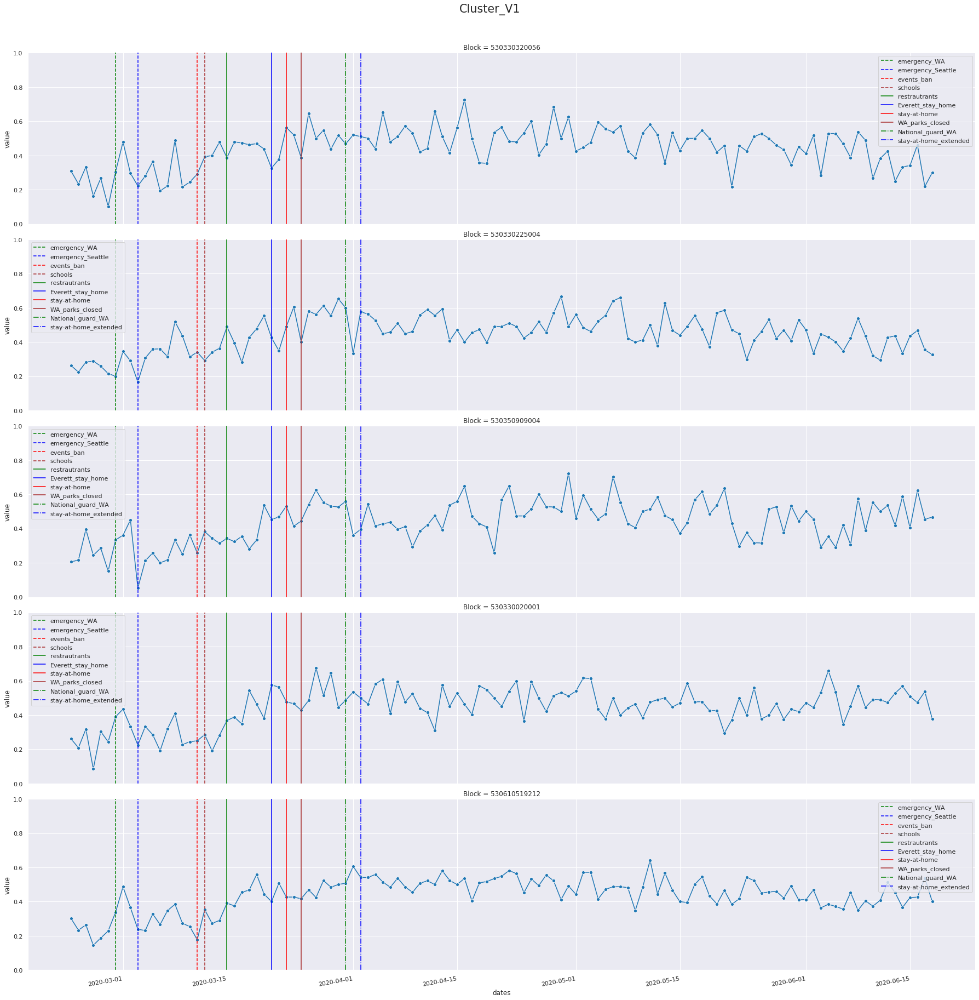

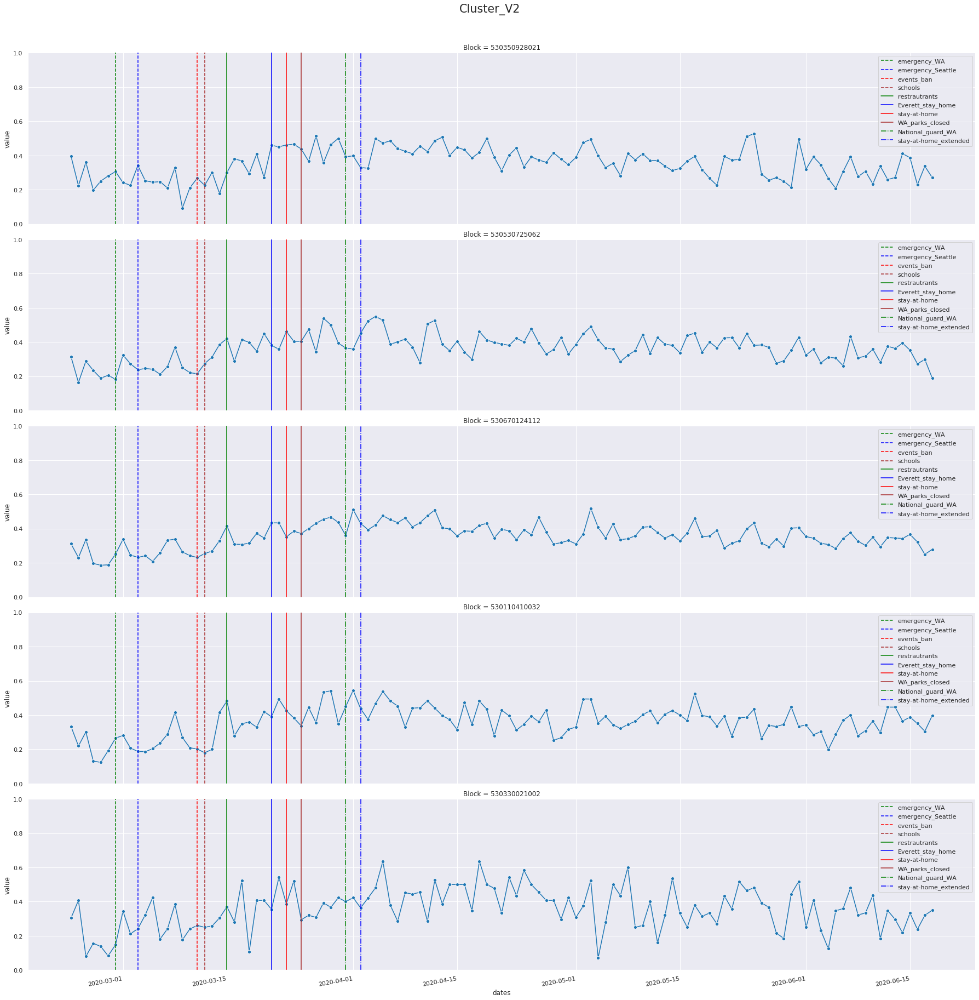

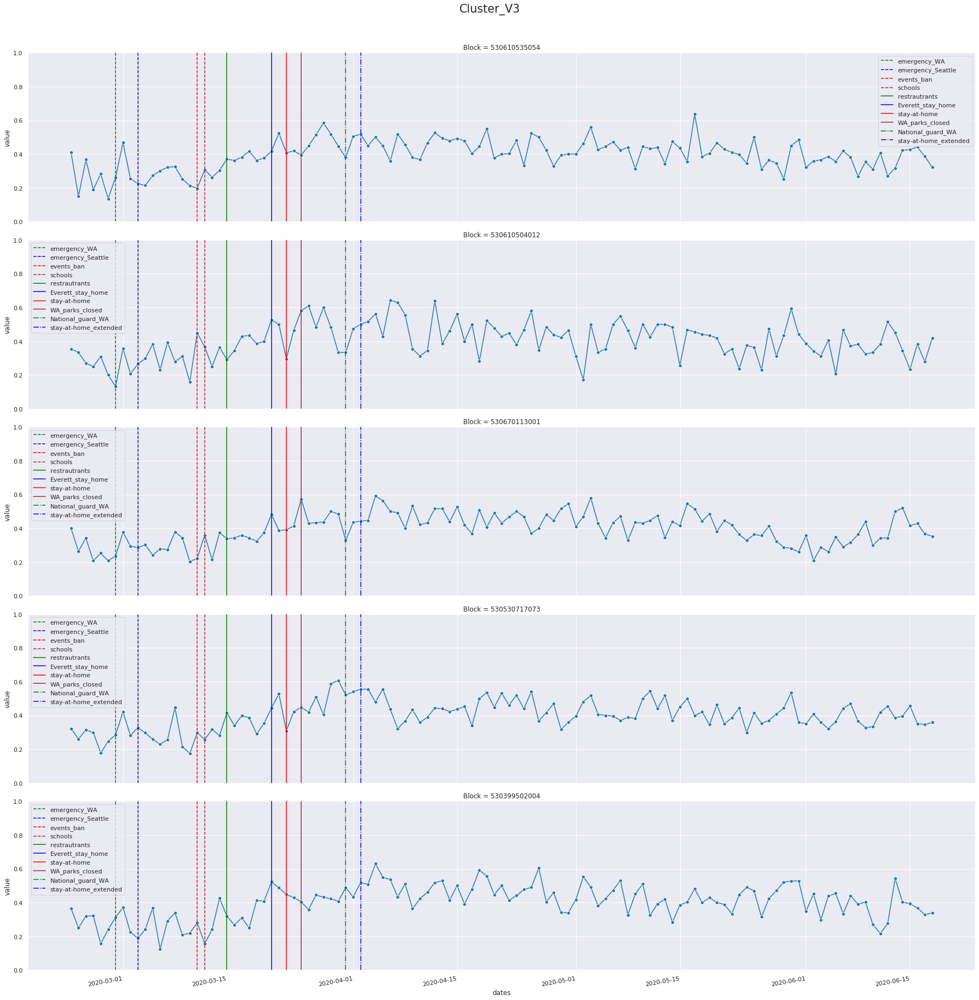

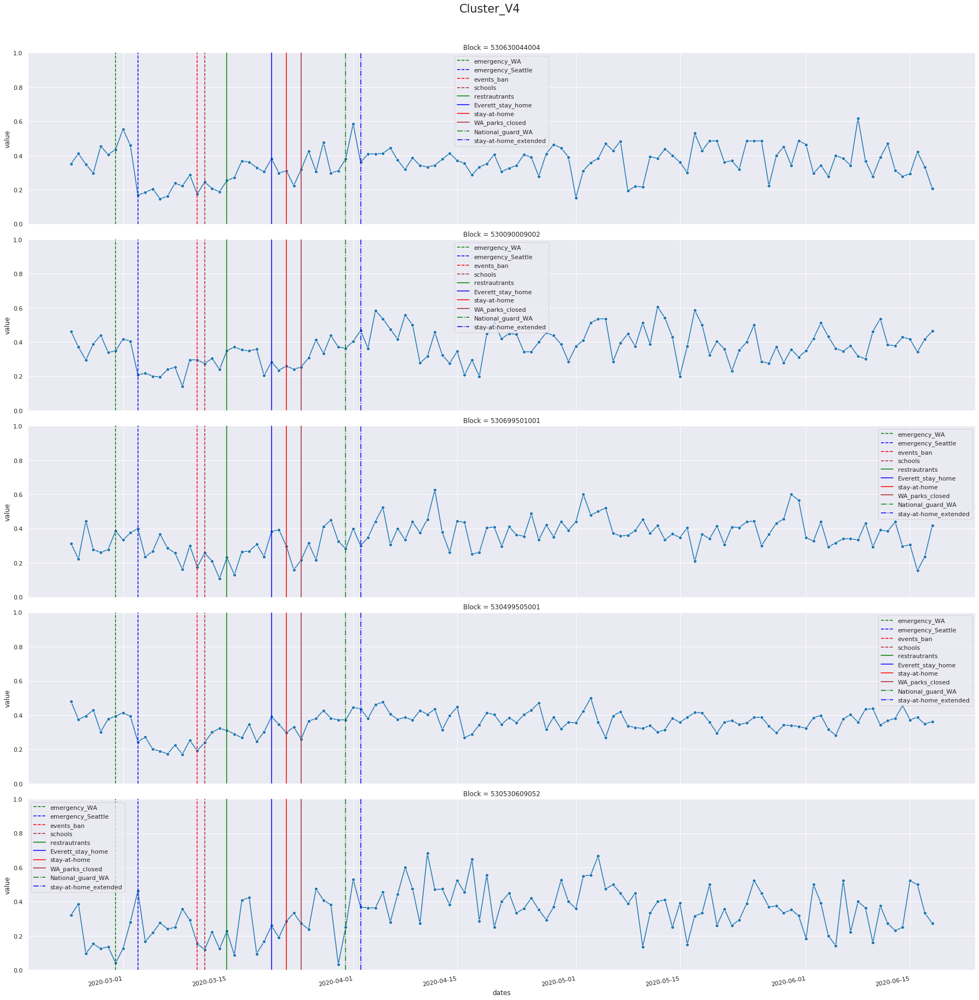

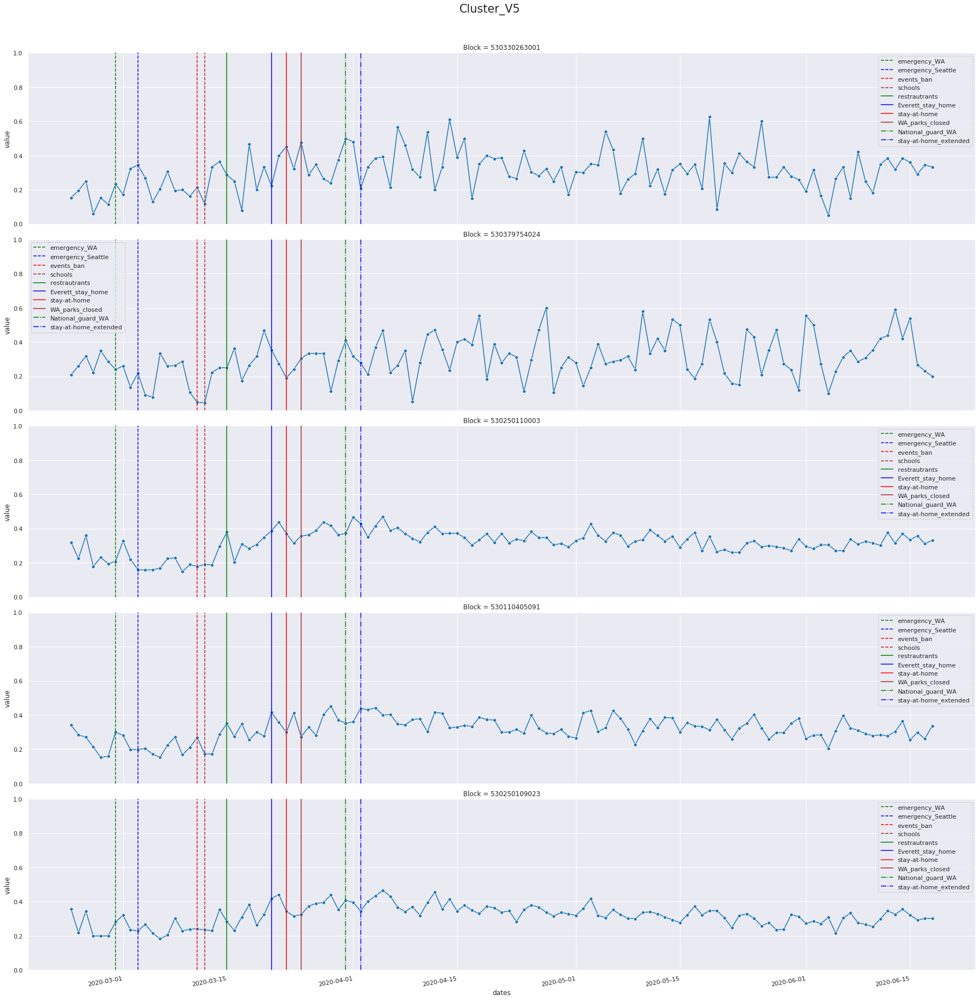

In [18]:
#Look at the closest time series
for cluster in SE_means.columns:   
    filename_ts_plot = FIGURES_ADDITIONAL_PATH + 'SE_closest_time_series_'+cluster+'.png'
    plot_time_series(closest_to_mean_samples[cluster], 'Cluster_'+cluster, filename = filename_ts_plot)

2D Args: {'n_neighbors': 50, 'n_components': 2, 'n_jobs': -1}
3D Args: {'n_neighbors': 50, 'n_components': 3, 'n_jobs': -1}


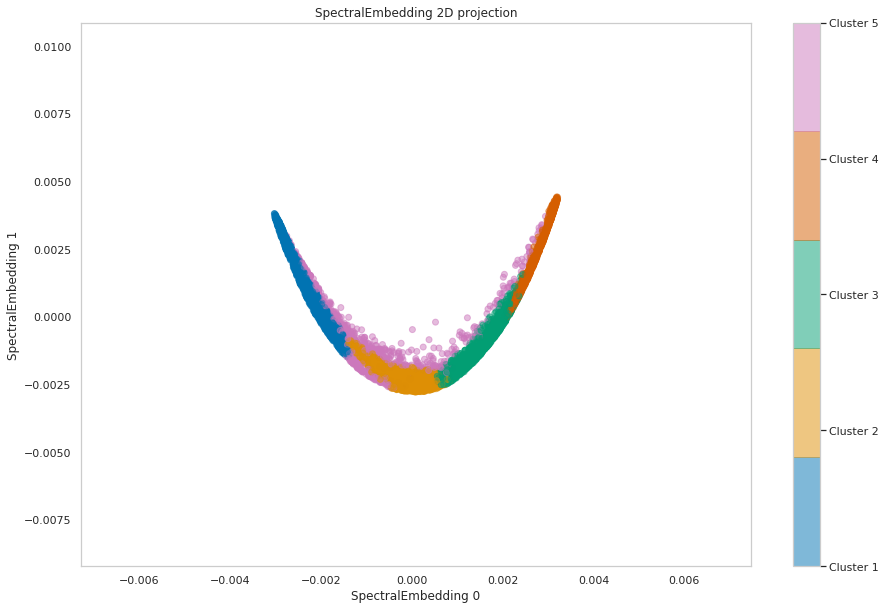

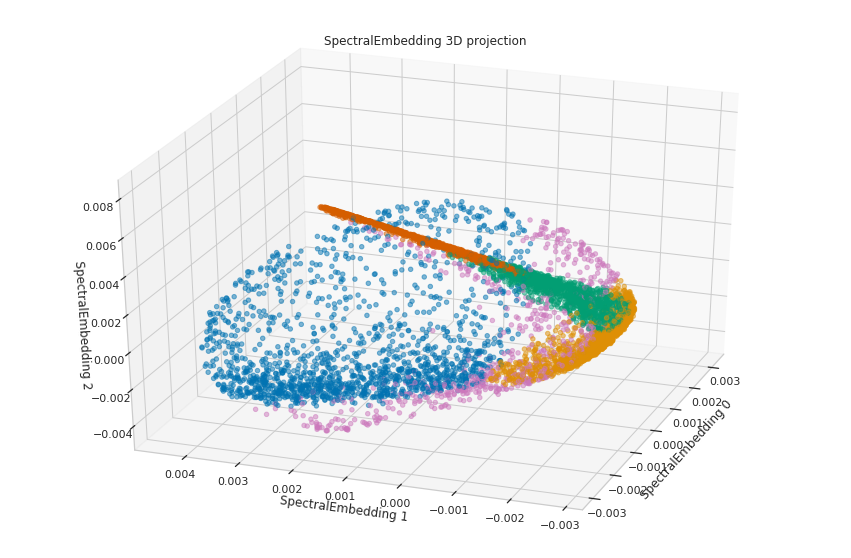

In [300]:
#Viz on the emb
#CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
# sns.set_palette("tab10")
filename_SE_clustering = os.path.join(FIGURE_PATH, 'reordered_SE_clustering')
X_2D_SE, X_3D_SE = viz_SE(X, reordered_SE_clusters, filename = filename_SE_clustering, alpha = 0.5, cbar = 'clustering')

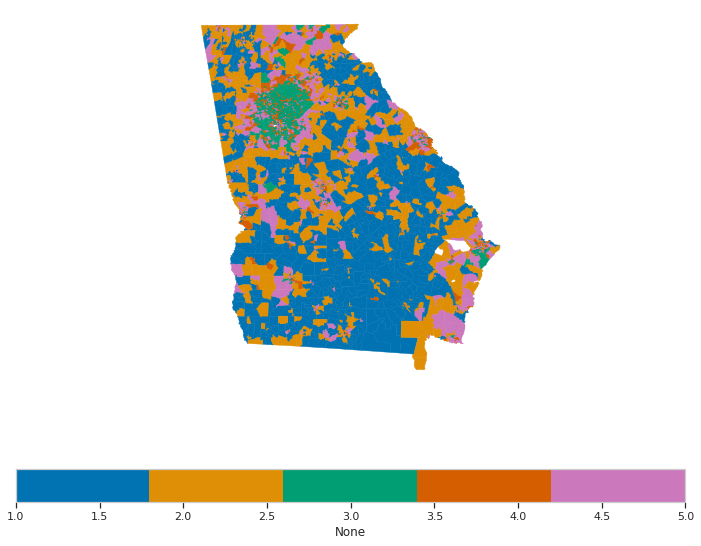

In [97]:
# #Viz clustering on the map
# sns.set_palette("tab10")
filename_SE_clustering_map = os.path.join(FIGURE_PATH, 'clustering_map_SE')
viz_cluster_map(SE_clusters, index_X, filename = filename_SE_clustering_map, cmap = 'clust')

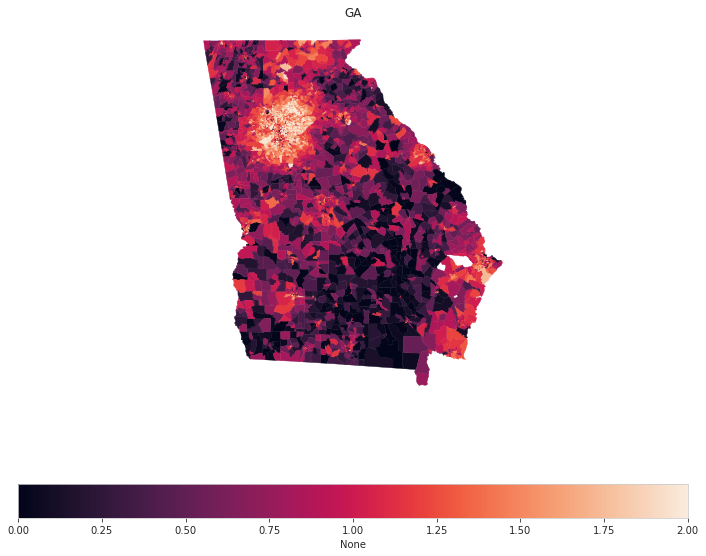

In [11]:
# #Viz colormap
filename_SE_colormap_map = os.path.join(FIGURE_PATH, 'colormap_map_SE')
viz_cluster_map(cos_colors, index_X, filename = filename_SE_colormap_map, title = 'GA', c)

### Plot the mean time series and reorder colors:

In [216]:
# SE_clusters_block_indexed = pd.Series(['Cluster ' + str(i) for i in SE_clusters], index = index_X)
SE_clusters_block_indexed = pd.Series(SE_clusters, index = index_X)
SE_clusters_block_indexed

Unnamed: 0
130099707011    1.0
131390004002    2.0
132719502001    1.0
132719502002    1.0
130950109002    2.0
               ... 
131210102091    3.0
132779603005    2.0
130670311013    3.0
131350505292    5.0
132859601004    2.0
Length: 5510, dtype: float64

In [242]:
df_CI = covid_ga_.dropna()#[SE_clusters_block_indexed['x']==4]
df_CI['cluster'] = SE_clusters_block_indexed.astype('int')
df_CI['block'] = df_CI.index
# melted_df = pd.melt(df_CI,
#                         id_vars=['cluster', 'block'], # Variables to keep
#                         var_name="dates")
# melted_df
# sns.set_palette('colorblind')
# g = sns.relplot(x="dates", y="value", kind="line", hue = 'cluster', data=melted_df, aspect = 5, ci = None, estimator = 'mean')
# g.fig.autofmt_xdate(0, 90)

/home/rlevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/rlevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [243]:
type(melted_df['cluster'][0])

str

In [244]:
dates = df_CI.columns.drop(['block', 'cluster'])
avg_per_clust = df_CI.groupby('cluster').mean()[dates]#[dates].plot()

In [312]:
from scipy.spatial.distance import squareform, pdist

def intersection(f, g):
#     dates_of_intersection = f.index[38:]
    f1 = f[38:]
    g1 = g[38:]
    idx = np.argwhere(np.diff(np.sign(f1 - g1))).flatten()
    return len(idx)

def relabel_clusters(clusters, avg_per_clust, means):
    means = means.copy()
    num_clust = len(np.unique(clusters))
    intersections = pd.DataFrame(squareform(pdist(avg_per_clust, metric = intersection)), index = avg_per_clust.index, columns = avg_per_clust.index)
    #Define the one with more than 1 intersection as the off-manifold
    off_manifold = int(np.squeeze(np.where((intersections > 0).sum() > 1)))+1
    off_manifold_bool = ((intersections > 0).sum() > 1).values
    ordered_clusters_no_off_manifold = avg_per_clust.T.mean()[~off_manifold_bool].sort_values()[::-1]
#     print(ordered_clusters_no_off_manifold)
    new_ordered_clusters = []
    new_ordered_mean_cols = {}
    for cluster in clusters:
#         print(clusters)
#         print(off_manifold)
        if cluster == off_manifold:
            new_ordered_clusters.append(num_clust)
            new_ordered_mean_cols['V'+str(cluster)] = 'V'+str(num_clust)
        else:
#             print('cluster: ', cluster)
#             print(ordered_clusters_no_off_manifold.index)
#             print(np.where(cluster == ordered_clusters_no_off_manifold.index))
            new_clust_label = int(np.squeeze(np.where(int(cluster) == ordered_clusters_no_off_manifold.index.astype('int'))))+1
            new_ordered_clusters.append(new_clust_label)
            new_ordered_mean_cols['V'+str(cluster)] = 'V'+str(new_clust_label)
    return np.array(new_ordered_clusters), means.rename(columns = new_ordered_mean_cols)

In [313]:
reordered_SE_clusters, reordered_SE_means = relabel_clusters(SE_clusters.astype('int'), avg_per_clust, SE_means)

In [259]:
SE_clusters.astype('int')

array([1, 2, 1, ..., 3, 5, 2])

In [311]:
SE_means

,V1,V2,V3,V4,V5
0,0.002700,0.001518,-0.002293,-0.000737,-0.000257
1,0.002212,-0.000977,0.001262,-0.000629,-0.002139
2,0.000337,-0.000283,0.000430,-0.000480,-0.000470
3,0.000963,-0.001892,-0.000282,0.001287,0.000894
4,-0.000290,-0.000299,-0.000437,-0.000039,0.001378
5,-0.000208,0.000263,0.000128,-0.000163,-0.000013
6,-0.000299,0.000212,-0.000497,0.002834,-0.000548
7,-0.000868,0.000960,0.000492,0.000228,-0.000940
8,-0.000536,0.000878,0.000159,-0.000388,-0.000520
9,-0.000149,-0.000269,-0.000322,0.002348,-0.000427


In [310]:
reordered_means

,W4,W3,W1,W5,W2
0,0.002700,0.001518,-0.002293,-0.000737,-0.000257
1,0.002212,-0.000977,0.001262,-0.000629,-0.002139
2,0.000337,-0.000283,0.000430,-0.000480,-0.000470
3,0.000963,-0.001892,-0.000282,0.001287,0.000894
4,-0.000290,-0.000299,-0.000437,-0.000039,0.001378
5,-0.000208,0.000263,0.000128,-0.000163,-0.000013
6,-0.000299,0.000212,-0.000497,0.002834,-0.000548
7,-0.000868,0.000960,0.000492,0.000228,-0.000940
8,-0.000536,0.000878,0.000159,-0.000388,-0.000520
9,-0.000149,-0.000269,-0.000322,0.002348,-0.000427


In [185]:
avg_per_clust.T

cluster,Cluster 1.0,Cluster 2.0,Cluster 3.0,Cluster 4.0,Cluster 5.0
2020/02/23,0.215647,0.247402,0.279953,0.260403,0.278780
2020/02/24,0.174500,0.207579,0.242712,0.230800,0.243610
2020/02/25,0.352933,0.352669,0.368927,0.328991,0.352254
2020/02/26,0.152357,0.178950,0.206779,0.208717,0.205158
2020/02/27,0.139836,0.166276,0.199513,0.193975,0.197035
...,...,...,...,...,...
2020/06/14,0.224232,0.269414,0.362033,0.371968,0.317097
2020/06/15,0.203576,0.246010,0.359292,0.371320,0.303720
2020/06/16,0.203500,0.250471,0.357249,0.346405,0.303385
2020/06/17,0.181782,0.222319,0.326424,0.317115,0.272885


In [186]:
type(avg_per_clust.T['Cluster 1.0'].iloc[0])

numpy.float64

In [187]:
avg_per_clust.T['Cluster 1.0']

2020/02/23    0.215647
2020/02/24    0.174500
2020/02/25    0.352933
2020/02/26    0.152357
2020/02/27    0.139836
                ...   
2020/06/14    0.224232
2020/06/15    0.203576
2020/06/16    0.203500
2020/06/17    0.181782
2020/06/18    0.179305
Name: Cluster 1.0, Length: 117, dtype: float64

In [188]:
intersection(avg_per_clust.T['Cluster 4.0'].values, avg_per_clust.T['Cluster 3.0'].values)

6

In [197]:
intersections = pd.DataFrame(squareform(pdist(avg_per_clust, metric = intersection)), index = avg_per_clust.index, columns = avg_per_clust.index)
(intersections > 0).sum() > 1

cluster
Cluster 1.0    False
Cluster 2.0    False
Cluster 3.0    False
Cluster 4.0     True
Cluster 5.0    False
dtype: bool

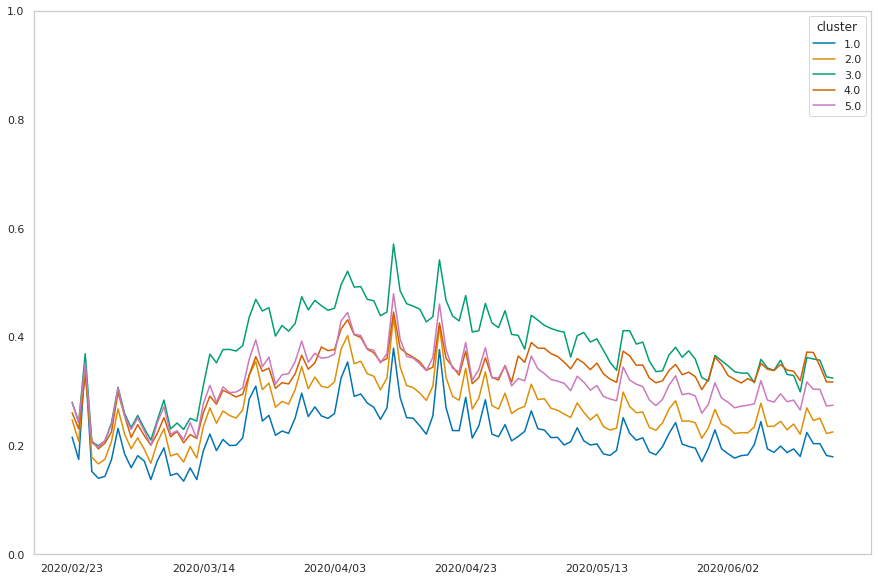

In [229]:
ax = plt.figure(figsize=(15, 10)).add_subplot(111)
avg_per_clust.T.plot(ax = ax, ylim = [0,1])
filename_avg_ts = os.path.join(FIGURE_PATH, 'avg_ts_per_clust')
plt.savefig(filename_avg_ts)
# ax.autofmt_xdate()

In [274]:
new_order = avg_per_clust.T.mean()[~((intersections > 0).sum() > 1).values]

In [275]:
int(np.squeeze(np.where(int(SE_clusters[1]) == new_order.index)))

1

In [276]:
new_order

cluster
1    0.220438
2    0.267012
3    0.376815
5    0.313219
dtype: float64

In [272]:
SE_clusters[1]

2.0

In [304]:
closest_to_mean_samples['V1']

,2020/02/23,2020/02/24,2020/02/25,2020/02/26,2020/02/27,2020/02/28,2020/02/29,2020/03/01,2020/03/02,2020/03/03,...,2020/06/09,2020/06/10,2020/06/11,2020/06/12,2020/06/13,2020/06/14,2020/06/15,2020/06/16,2020/06/17,2020/06/18
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
130179605004,0.384615,0.241379,0.200000,0.125000,0.074074,0.038462,0.125000,0.135135,0.208333,0.112903,...,0.263158,0.090909,0.125000,0.411765,0.200000,0.066667,0.478261,0.083333,0.272727,0.416667
130131804021,0.145455,0.369231,0.239437,0.333333,0.356164,0.348485,0.112903,0.183099,0.407407,0.088889,...,0.150000,0.183673,0.062500,0.128205,0.127273,0.071429,0.190476,0.162162,0.205128,0.068182
131790101031,0.142857,0.350000,0.200000,0.047619,0.050000,0.058824,0.083333,0.133333,0.304348,0.166667,...,0.181818,0.200000,0.133333,0.181818,0.117647,0.375000,0.142857,0.047619,0.062500,0.111111
130159606002,0.066667,0.102564,0.210526,0.071429,0.106383,0.170213,0.057692,0.074074,0.426471,0.078652,...,0.187500,0.163636,0.200000,0.183673,0.148148,0.145455,0.235294,0.309091,0.120000,0.125000
130659701003,0.264706,0.170732,0.250000,0.162162,0.216216,0.181818,0.212121,0.262295,0.153846,0.132075,...,0.379310,0.166667,0.035714,0.218750,0.272727,0.064516,0.172414,0.192308,0.200000,0.333333


In [305]:
SE_means.plot()

,V1,V2,V3,V4,V5
0,0.002700,0.001518,-0.002293,-0.000737,-0.000257
1,0.002212,-0.000977,0.001262,-0.000629,-0.002139
2,0.000337,-0.000283,0.000430,-0.000480,-0.000470
3,0.000963,-0.001892,-0.000282,0.001287,0.000894
4,-0.000290,-0.000299,-0.000437,-0.000039,0.001378
5,-0.000208,0.000263,0.000128,-0.000163,-0.000013
6,-0.000299,0.000212,-0.000497,0.002834,-0.000548
7,-0.000868,0.000960,0.000492,0.000228,-0.000940
8,-0.000536,0.000878,0.000159,-0.000388,-0.000520
9,-0.000149,-0.000269,-0.000322,0.002348,-0.000427


In [306]:
SE_z

array([[1.00000000e+000, 0.00000000e+000, 0.00000000e+000,
        3.81250801e-063, 0.00000000e+000],
       [0.00000000e+000, 1.00000000e+000, 0.00000000e+000,
        1.45265954e-035, 0.00000000e+000],
       [1.00000000e+000, 0.00000000e+000, 0.00000000e+000,
        7.53603327e-097, 0.00000000e+000],
       ...,
       [0.00000000e+000, 0.00000000e+000, 1.00000000e+000,
        9.53388823e-023, 0.00000000e+000],
       [0.00000000e+000, 0.00000000e+000, 0.00000000e+000,
        6.09965094e-017, 1.00000000e+000],
       [1.18077000e-124, 1.00000000e+000, 0.00000000e+000,
        1.36803314e-037, 0.00000000e+000]])